$
\newcommand\var{\operatorname{var}}
\newcommand\cov{\operatorname{cov}}
$

__記号の定義__

Let $X_1,\ldots,X_n$ be a sample with size $n$ of a distribution with mean $\mu$ and variance $\sigma^2$ and set

$$
\begin{aligned}
&
\bar{X} = \frac{1}{n}\sum_{i=1}^n X_i,
\\ &
S^2 = \frac{1}{n-1}\sum_{i=1}^n (X_i - \bar{X})^2,
\\ &
Z = \frac{\sqrt{n}(X - \mu)}{\sigma}
\quad (\text{expected to follow the standard normal distribution}),
\\ &
W = \sqrt{n}\frac{S^2}{\sigma^2},
\\ &
X^2 = \frac{(n-1)S^2}{\sigma^2} = \frac{1}{\sigma^2}\sum_{i=1}^n (X_i - \bar{X})^2
\quad (\text{expected to follow the chi-sauared distribution with df = $n-1$}),
\\ &
T = \frac{\sqrt{n}(X - \mu)}{S} = \frac{\sigma}{S}Z
\quad (\text{expected to follow the t-distribution with df = $n-1$}).
\end{aligned}
$$

Then $T^2$ is expected to follow the F-distribution with dfs = ($1$, $n-1$).

$Z = \sqrt{n}(\bar{X} - \mu)/\sigma$ and $W = \sqrt{n}\;S^2/\sigma^2$ satisfy
$$
\begin{aligned}
\\ &
E[Z] = 0, \quad E[W] = \sqrt{n},
\\ &
\var(Z) = 1,
\quad
\cov(Z, W) = \kappa_3
\quad
\var(W) = \kappa_4 + 2 + \frac{2}{n-1}
\\ &
E[Z^2] = 1, \quad E[W] = \sqrt{n},
\\ &
\var(Z^2) = \frac{\kappa_4}{n} + 2,
\quad
\cov(Z^2, W) = \frac{\kappa_4}{\sqrt{n}},
\quad
\var(W) = \kappa_4 + 2 + \frac{2}{n-1}.
\end{aligned}
$$

$Z = \sqrt{n}(\bar{X} - \mu)/\sigma$ and $R^2 = S^2/\sigma^2$ satisfy
$$
\begin{aligned}
\\ &
E[Z] = 0, \quad E[R^2] = 1,
\\ &
\var(Z) = 1,
\quad
\cov(Z, R^2) = \frac{\kappa_3}{\sqrt{n}}
\quad
\var(R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1}
\\ &
E[Z^2] = 1, \quad E[R^2] = 1,
\\ &
\var(Z^2) = \frac{\kappa_4}{n} + 2,
\quad
\cov(Z^2, R^2) = \frac{\kappa_4}{n},
\quad
\var(R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1}.
\end{aligned}
$$

__この Part 2 でのプロット__

$(Z^2, S^2/\sigma^2)$ をプロットしたい.

__Part 1 でのプロット__

次の４つをプロットした:

1. $(Z, X^2)$ のサンプルの散布図
2. $X^2$ の値を決めたときの $Z$ の条件付き確率分布の密度函数 $p(z|x^2)$ のサンプルからの推定結果
3. $X^2$ の分布と自由度 $n-1$ のカイ二乗分布の比較
4. $T^2$ の分布と自由度 $(1, n-1)$ のF分布の比較

$T$ そのものの分布ではなく、その二乗の分布を見ることに注意。検定で使われるのは $T$ の絶対値だけなのであった。 

2におけるシアンの線はZの値の下位５％と上位95%の部分の境界である。推定値なので少しギザギザしてしまっている。

$Z$ と $X^2$ が確率変数として独立な場合にはシアンの線が縦軸に平行になる。

In [108]:
using Distributions
using StatsPlots
default(fmt=:png, titlefontsize=8, legendfontsize=7, guidefontsize=8, tickfontsize=6)
using Random
using KernelDensity
using QuadGK
using StatsBase

safediv(x, y) = y == 0 ? y : x/y

function myquantile(y, Y, Z, p; δ=log2(y)/4)
    mask = @. y - δ < Y < y + δ
    !any(mask) && return NaN
    quantile(Z[mask], p)
end

function mymean(y, Y, Z, p; δ=log2(y)/4)
    mask = @. y - δ < Y < y + δ
    !any(mask) && return NaN
    mean(Z[mask])
end

myskewness(dist) = skewness(dist)
myskewness(dist::MixtureModel) = _myskewness(dist)
function _myskewness(dist)
    μ, σ = mean(dist), std(dist)
    f(x) = ((x - μ)/σ)^3 * pdf(dist, x)
    quadgk(f, extrema(dist)...)[1]
end

mykurtosis(dist) = kurtosis(dist)
mykurtosis(dist::MixtureModel) = _mykurtosis(dist)
function _mykurtosis(dist)
    μ, σ = mean(dist), std(dist)
    f(x) = ((x - μ)/σ)^4 * pdf(dist, x)
    quadgk(f, extrema(dist)...)[1] - 3
end

rd(x; digits=4) = round(x; digits)

name(dist) = replace(string(dist), r"\{.*\}"=>"")
name(dist::MixtureModel) = _name(dist)
function _name(dist::MixtureModel)
    c = components(dist)
    p = probs(dist)
    s = string(p[1]) * name(c[1])
    for i in 2:length(p)
        s = s * "+" * string(p[i]) * name(c[i])
    end
    s
end

_name (generic function with 1 method)

In [40]:
function mcsim(;
        dist = Beta(0.2, 0.3),
        n = 20,
        L = 10^6,
    )
    μ, σ = mean(dist), std(dist)
    Z = Vector{Float64}(undef, L) # expected to follow Normal(1,0)
    X² = similar(Z)               # expected to follow Chisq(n-1)
    tmp = [Vector{Float64}(undef, n) for i in 1:Threads.nthreads()]
    Threads.@threads for i in 1:L
        X = rand!(dist, tmp[Threads.threadid()])
        X̄ = mean(X) # sample mean
        S² = var(X) # sample unbiased variance
        Z[i] = √n * (X̄ - μ) / σ
        X²[i] = (n - 1) * S²/σ^2
    end
    T = @. Z / √(X²/(n - 1)) # expected to follow TDist(n-1)
    T² = @. T .^ 2           # expected to follow FDist(1, n-1)
    (; dist, n, Z, X², T, T²)
end

function plot_samplestats(;
        dist = Normal(1, 2),
        n = 10,
        L = 10^6,
        scattermax = 10^5,
        T²span = (0.75, 0.999),
        Zspan = (0.001, 0.999), 
        X²span = (0.001, 0.999), 
        kwargs...
    )
    (; dist, n, Z, X², T, T²) = mcsim(; dist, n, L)
    distname = name(dist)
    sk = myskewness(dist)
    ku = mykurtosis(dist)
    fdist = FDist(1, n-1)
    
    println(L, " samples with size n = ", n, " of ", distname)
    println("skewness, kurtosis = ", rd(sk), ", ", rd(ku))
    for p in (0.95,)# 0.99)
        println("√quantile(T², $p) = ", rd(√quantile(T², p)), ",  ")
        println("P(|T| > √quantile(FDist(1, $(n-1)), $p) = ", rd(√quantile(fdist, p)), ") = ",  rd(1 - ecdf(T²)(quantile(fdist, p))))
    end
    
    Zlim = quantile.(Ref(Z), Zspan)
    X²lim = quantile.(Ref(X²), X²span)
    
    kdeX² = InterpKDE(kde(X²))
    kdeZX² = InterpKDE(kde((Z, X²)))
    g(z, x²) = safediv(pdf(kdeZX², z, x²), pdf(kdeX², x²))
    kdeT² = InterpKDE(kde(T²))
    h(t²) = pdf(kdeT², t²)
    
    P = plot(; colorbar=false)
    plot!(; xlabel="Z = √n(X̄ - μ)/σ", ylabel="X² = (n - 1)S²/σ²", xlim=Zlim, ylim=X²lim)
    scatter!(Z[1:min(end, scattermax)], X²[1:min(end, scattermax)]; alpha=0.3, msw=0, ms=1, label="")
    vline!([0]; label="", ls=:dot, c=:red)
    hline!([n-1]; label="", ls=:dot, c=:red)
    title!("$distname, n=$n")
    
    z = range(Zlim..., 200)
    x² = range(X²lim..., 200)
    z05 = (x² -> myquantile(x², X², Z, 0.05)).(x²)
    z95 = (x² -> myquantile(x², X², Z, 0.95)).(x²)
    Q = plot(; colorbar=false)
    plot!(; xlabel="Z = √n(X̄ - μ)/σ conditioned by X²", ylabel="X² = (n - 1)S²/σ²", xlim=Zlim, ylim=X²lim)
    heatmap!(z, x², g)
    plot!(z05, x²; label="", c=:cyan)
    plot!(z95, x²; label="", c=:cyan)
    vline!([0]; label="", ls=:dot, c=:pink)
    hline!([n-1]; label="", ls=:dot, c=:pink)
    title!("p(z|x²)")
    
    chisqdist = Chisq(n-1)
    xlim = (max(0.0, quantile(X², 0.005) - 10), max(quantile(X², 0.995), quantile(chisqdist, 0.999)))
    R = plot(; xlabel="X² = (n - 1)S²/σ²", ylabel="density", xlim)
    histogram!(X²; norm=true, alpha=0.3, bin=range(xlim..., 100), label="X²")
    plot!(chisqdist, xlim...; label="Chisq($(n-1))", lw=1.5)
    vline!([n-1]; label="", ls=:dot, c=:black)
    title!("sample of X² = (n - 1)S²/σ²")
    
    xlim = quantile.(Ref(T²), T²span)
    bin = range(0, last(xlim), round(Int, 100last(xlim)/(last(xlim) - first(xlim))))
    ymax = maximum(x -> max(pdf(fdist, x), h(x)), range(xlim..., 100))
    ylim = (-0.03ymax, 1.05ymax)
    S = plot(; xlabel="T² where T = √n(X̄ - μ)/S", ylabel="density", xlim, ylim)
    histogram!(T²; norm=true, alpha=0.3, bin=bin, label="T²")
    plot!(fdist, xlim...; label="FDist(1, $(n-1))", lw=1.5)
    vline!([quantile(T², 0.95)]; label="95% line of T²", c=1, ls=:dot)
    vline!([quantile(fdist, 0.95)]; label="95% line of FDist", c=2, ls=:dot)
    title!("tail (> $(100first(T²span))%) of sample of T²")
    
    plot(P, Q, R, S; size=(800, 600))
    plot!(leftmargin=3Plots.mm, bottommargin=3Plots.mm, kwargs...)
end

plot_samplestats (generic function with 1 method)

In [454]:
function simZR(;
        dist = Uniform(),
        n = 20,
        L = 10^6,
    )
    μ, σ = mean(dist), std(dist)
    Z = Vector{Float64}(undef, L) # Z² is expected to follow Chisq(1)/1.        mean(Z²) ≈ 1, var(Z²) ≈ 2
    R² = similar(Z)               # R² is expected to follow Chisq(n-1)/(n-1).  mean(R²) ≈ 1, var(R²) ≈ 2/(n-1)
    tmp = [Vector{Float64}(undef, n) for i in 1:Threads.nthreads()]
    Threads.@threads for i in 1:L
        X = rand!(dist, tmp[Threads.threadid()])
        X̄ = mean(X) # sample mean
        S² = var(X) # sample unbiased variance
        Z[i] = √n * (X̄ - μ) / σ
        R²[i] = S² / σ^2
    end
    Z² = @. Z^2
    T² = @. Z² / R² # expected to follow FDist(1, n-1)
    (; dist, n, Z, Z², R², T²)
end

function plotZR(;
        dist = Uniform(),
        n = 10,
        L = 10^6,
        scattermax = 10^5,
        Zspan = (0.001, 0.999), 
        Z²span = (0.001, 0.999), 
        R²span = (0.001, 0.999), 
        T²span = (0.001, 0.999), 
        kwargs...
    )
    (; dist, n, Z, Z², R², T²) = simZR(; dist, n, L)
    distname = name(dist)
    κ₃ = myskewness(dist)
    κ₄ = mykurtosis(dist)
    fdist = FDist(1, n-1)
   
    println(L, " samples with size n = ", n, " of ", distname)
    println("skewness, kurtosis = ", rd(κ₃), ", ", rd(κ₄))
    for p in (0.95,)# 0.99)
        println("√quantile(T², $p) = ", rd(√quantile(T², p)), ",  ")
        println("P(|T| > √quantile(FDist(1, $(n-1)), $p) = ", rd(√quantile(fdist, p)), ") = ",  rd(1 - ecdf(T²)(quantile(fdist, p))))
    end
     
    @show Z²lim = quantile.(Ref(Z²), Z²span)
    @show R²lim = quantile.(Ref(R²), R²span)

    @show mean(Z²), std(Z²), √(κ₄/n + 2)
    @show mean(R²), std(R²), √(κ₄/n + 2/(n-1))
    @show cov(Z², R²), κ₄/n

    kdeR² = InterpKDE(kde(R²))
    kdeZ²R² = InterpKDE(kde((Z², R²)))
    g(z², r²) = √(max(eps(), pdf(kdeZ²R², z², r²)) / max(eps(), pdf(kdeR², r²)))

    kdeT²R² = InterpKDE(kde((T², R²)))
    h(z², r²) = √(max(eps(), pdf(kdeT²R², z², r²)) / max(eps(), pdf(kdeR², r²)))
    #h(z², r²) = max(eps(), pdf(kdeT²R², z², r²)) / max(eps(), pdf(kdeR², r²))

    kdeT² = InterpKDE(kde(T²))
    h(t²) = pdf(kdeT², t²)
    
    P1 = plot(; colorbar=false)
    plot!(; xlabel="Z² = n(X̄ - μ)²/σ²", ylabel="R² = S²/σ²", xlim=Z²lim, ylim=R²lim)
    scatter!(Z²[1:min(end, scattermax)], R²[1:min(end, scattermax)]; alpha=0.3, msw=0, ms=1, label="")
    vline!([1]; label="", ls=:dot, c=:red)
    hline!([1]; label="", ls=:dot, c=:red)
    title!("$distname, n=$n")
    
    z² = range(Z²lim..., 200)
    t² = range(Z²lim..., 200)
    r² = range(R²lim..., 200)
    δ = (last(R²lim) - first(R²lim))/200
    
    λ₁ = cov(Z², R²)/var(R²)
    @show λ₁
    z²meanexpected = (r² -> r² ^ λ₁).(r²)
    z²mean = (r² -> mymean(r², R², Z², 0.95; δ)).(r²)
    z²95 = (r² -> myquantile(r², R², Z², 0.95; δ)).(r²)
   
    P2 = plot(; colorbar=false, legend=:right)
    plot!(; xlabel="Z² = n(X̄ - μ)²/σ² conditioned by R²", ylabel="R² = S²/σ²", xlim=Z²lim, ylim=R²lim)
    heatmap!(z², r², g)
    plot!(z²meanexpected, r²; label="r² ^ λ₁", c=:yellow)
    plot!(z²mean, r²; label="mean", c=:red, ls=:dash)
    plot!(z²95, r²; label="95%", c=:cyan)
    vline!([1]; label="", ls=:dot, c=:pink)
    hline!([1]; label="", ls=:dot, c=:pink)
    title!("√p(z²|r²)")
    
    λ₂ = √((κ₄/n + 2/(n-1)) / (2/(n-1)))
    @show -1 + λ₁
    @show - λ₂
    t²meanexpected1 = (r² -> r² ^ (- 1 + λ₁)).(r²)
    t²meanexpected2 = (r² -> r² ^ (- λ₂)).(r²)
    t²mean = (r² -> mymean(r², R², T², 0.50; δ)).(r²)
    t²95 = (r² -> myquantile(r², R², T², 0.95; δ)).(r²)
 
    P3 = plot(; colorbar=false, legend=:right)
    plot!(; xlabel="T² = n(X̄ - μ)²/S² conditioned by R²", ylabel="R² = S²/σ²", xlim=Z²lim, ylim=R²lim)
    #heatmap!(t², r², h)
    plot!(t²mean, r²; label="mean", c=:red)
    #plot!(t²meanexpected1, r²; label="", c=:yellow, ls=:dash)
    plot!(t²meanexpected2, r²; label="", c=:orange, ls=:dashdot)
    plot!(t²95, r²; label="95%", c=:cyan)
    hline!([1]; label="", ls=:dot, c=:pink)
    title!("√p(t²|r²)")
    
    P4 = plot(t², h)
    plot!(fdist, 0.1, extrema(t²)[2])
    
#     chisqdist = Chisq(n-1)
#     xlim = (max(0.0, quantile(X², 0.005) - 10), max(quantile(X², 0.995), quantile(chisqdist, 0.999)))
#     R = plot(; xlabel="X² = (n - 1)S²/σ²", ylabel="density", xlim)
#     histogram!(X²; norm=true, alpha=0.3, bin=range(xlim..., 100), label="X²")
#     plot!(chisqdist, xlim...; label="Chisq($(n-1))", lw=1.5)
#     vline!([n-1]; label="", ls=:dot, c=:black)
#     title!("sample of X² = (n - 1)S²/σ²")
    
#     xlim = quantile.(Ref(T²), T²span)
#     bin = range(0, last(xlim), round(Int, 100last(xlim)/(last(xlim) - first(xlim))))
#     ymax = maximum(x -> max(pdf(fdist, x), h(x)), range(xlim..., 100))
#     ylim = (-0.03ymax, 1.05ymax)
#     S = plot(; xlabel="T² where T = √n(X̄ - μ)/S", ylabel="density", xlim, ylim)
#     histogram!(T²; norm=true, alpha=0.3, bin=bin, label="T²")
#     plot!(fdist, xlim...; label="FDist(1, $(n-1))", lw=1.5)
#     vline!([quantile(T², 0.95)]; label="95% line of T²", c=1, ls=:dot)
#     vline!([quantile(fdist, 0.95)]; label="95% line of FDist", c=2, ls=:dot)
#     title!("tail (> $(100first(T²span))%) of sample of T²")
    
    plot(P1, P2, P3, P4; size=(800, 600))
    plot!(leftmargin=3Plots.mm, bottommargin=3Plots.mm, kwargs...)
end

plotZR (generic function with 1 method)

1000000 samples with size n = 10 of Normal(μ=1.0, σ=2.0)
skewness, kurtosis = 0.0, 0.0
√quantile(T², 0.95) = 2.2586,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0497
Z²lim = quantile.(Ref(Z²), Z²span) = (1.4615066256786277e-6, 10.807175263435918)
R²lim = quantile.(Ref(R²), R²span) = (0.12914601633015427, 3.102737569658993)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9993661313958379, 1.4115641343733991, 1.4142135623730951)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0003334771428642, 0.4719040255388666, 0.4714045207910317)
(cov(Z², R²), κ₄ / n) = (0.0007093597517716518, 0.0)
λ₁ = 0.003185364820352688
-1 + λ₁ = -0.9968146351796473
-λ₂ = -1.0


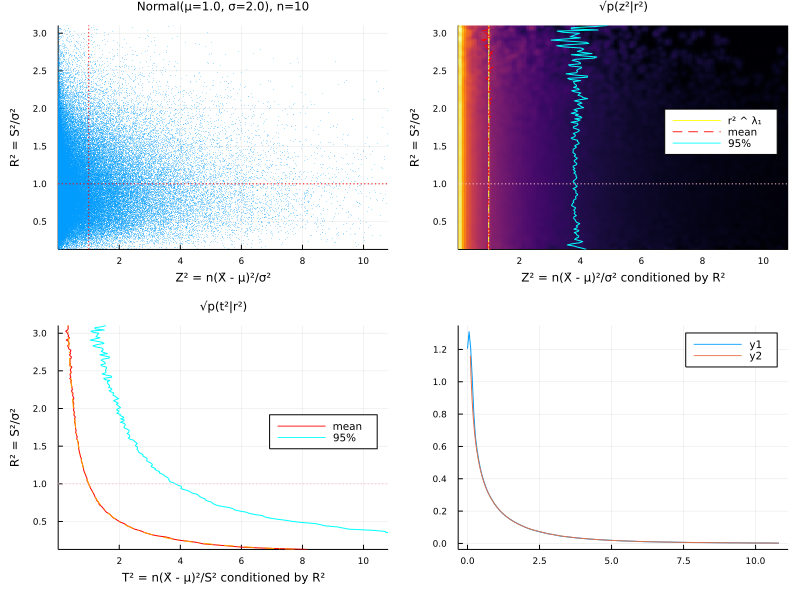

In [455]:
plotZR(; dist = Normal(1,2), n = 10)

1000000 samples with size n = 40 of Normal(μ=1.0, σ=2.0)
skewness, kurtosis = 0.0, 0.0
√quantile(T², 0.95) = 2.0219,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0499
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5750615028665235e-6, 10.795901450519553)
R²lim = quantile.(Ref(R²), R²span) = (0.4437044337030906, 1.8448269482643715)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9996772226357584, 1.4125180408727083, 1.4142135623730951)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0005589896788836, 0.2260278227388274, 0.22645540682891915)
(cov(Z², R²), κ₄ / n) = (-0.00057201433435351, 0.0)
λ₁ = -0.011196521254629698
-1 + λ₁ = -1.0111965212546297
-λ₂ = -1.0


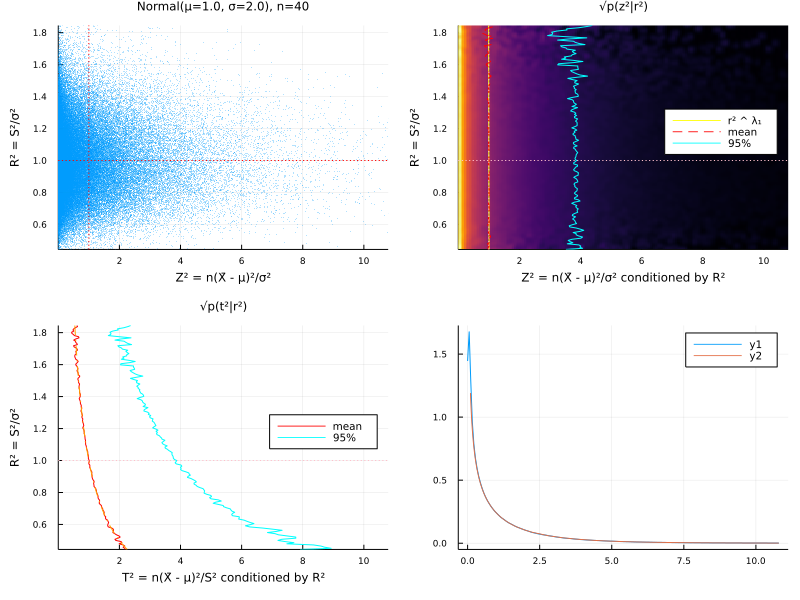

In [462]:
plotZR(; dist = Normal(1,2), n = 40)

1000000 samples with size n = 10 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 2.3168,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0541
Z²lim = quantile.(Ref(Z²), Z²span) = (1.6059647377029946e-6, 9.984435411995108)
R²lim = quantile.(Ref(R²), R²span) = (0.1888012779558759, 2.053583453765897)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0000315629499636, 1.372524859590219, 1.3711309200802089)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9997532553501751, 0.3202069763105168, 0.3197221015541813)
(cov(Z², R²), κ₄ / n) = (-0.12016773985884463, -0.12)
λ₁ = -1.1719964973090946
-1 + λ₁ = -2.1719964973090944
-λ₂ = -0.6782329983125268


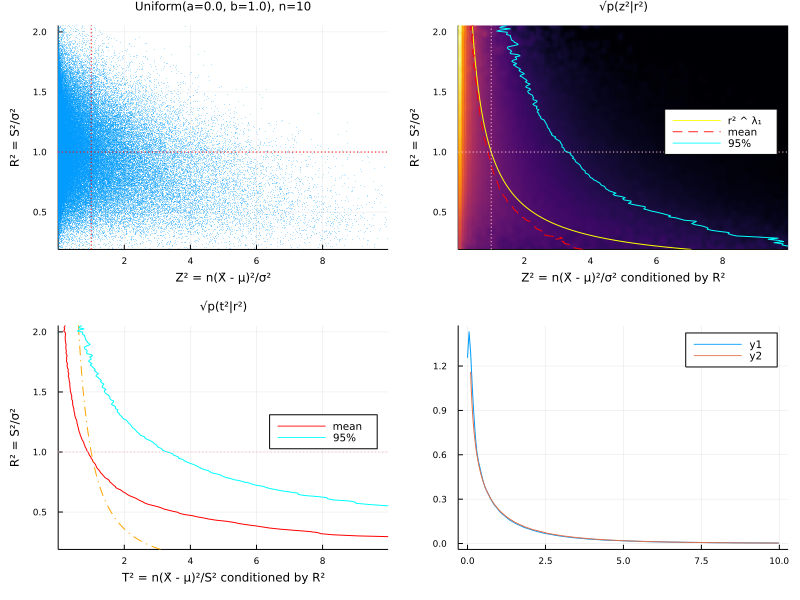

In [457]:
plotZR(; dist = Uniform(), n = 10)

1000000 samples with size n = 40 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 2.0252,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0502
Z²lim = quantile.(Ref(Z²), Z²span) = (1.545798467777859e-6, 10.67179243497957)
R²lim = quantile.(Ref(R²), R²span) = (0.5760733977960012, 1.4678881955956582)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9978869111375741, 1.4026220290932518, 1.40356688476182)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999593858460119, 0.14595222210728573, 0.14588369093922487)
(cov(Z², R²), κ₄ / n) = (-0.030052268691219092, -0.03)
λ₁ = -1.410768779797596
-1 + λ₁ = -2.4107687797975963
-1 - λ₂ = -1.0165180752906733


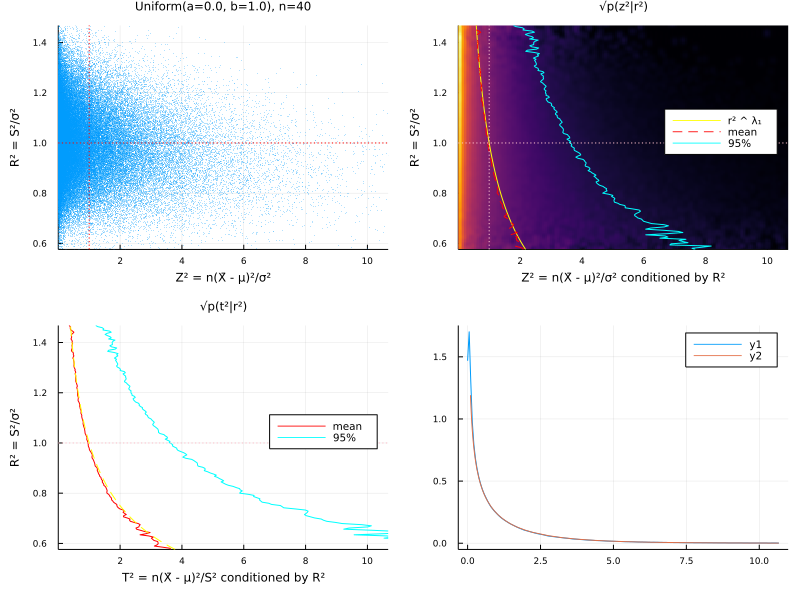

In [442]:
plotZR(; dist = Uniform(), n = 40)

1000000 samples with size n = 160 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9792,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0504
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5551313608424107e-6, 10.743937540444639)
R²lim = quantile.(Ref(R²), R²span) = (0.785581104315074, 1.2245419444831438)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0010183175904677, 1.4160656751866332, 1.4115594213493103)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0002030822262917, 0.07128704030990111, 0.07126441154041237)
(cov(Z², R²), κ₄ / n) = (-0.007701489179241664, -0.0075)
λ₁ = -1.515491627489438
-1 + λ₁ = -2.515491627489438
-1 - λ₂ = -1.003996309756962


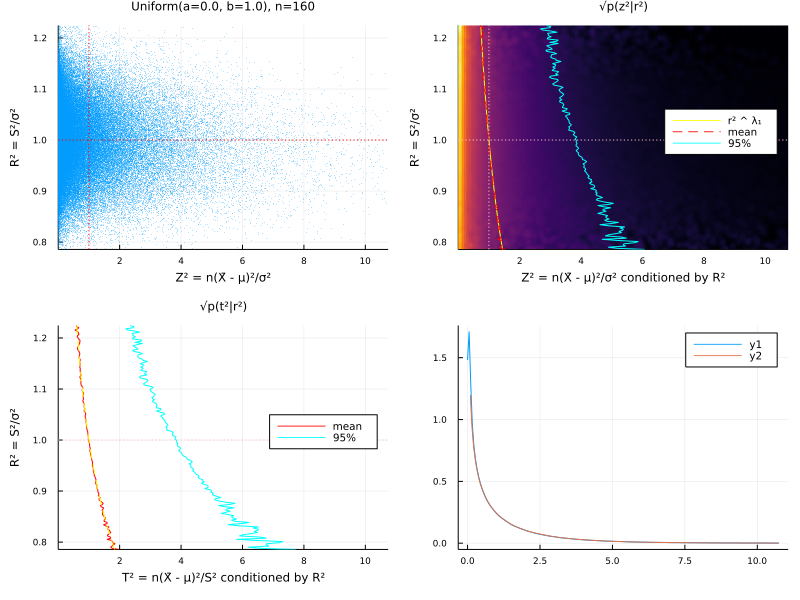

In [443]:
plotZR(; dist = Uniform(), n = 160)

1000000 samples with size n = 640 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9612,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0497
Z²lim = quantile.(Ref(Z²), Z²span) = (1.6020772454459766e-6, 10.915512613435828)
R²lim = quantile.(Ref(R²), R²span) = (0.89212460409665, 1.110132189977786)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0004260419907862, 1.415019823382248, 1.4135504943227177)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.000046566530405, 0.03541212744141221, 0.035424433006529775)
(cov(Z², R²), κ₄ / n) = (-0.0018337393746719628, -0.001875)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (-1.4622902133904851, -1.4941543257989085)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (1.0023724159194232, 0.007629617404441383, 0.003129890453834116)


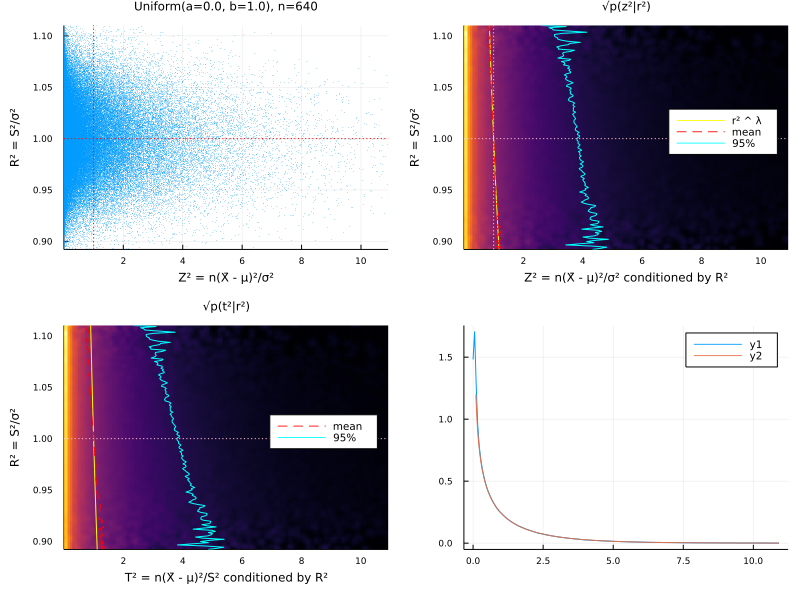

In [381]:
plotZR(; dist = Uniform(), n = 640)

1000000 samples with size n = 10 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 2.3165,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0538
Z²lim = quantile.(Ref(Z²), Z²span) = (1.6859482503831013e-6, 9.480380862095242)
R²lim = quantile.(Ref(R²), R²span) = (0.11086571076164059, 1.4935445558129523)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9992328437039505, 1.3506038808527037, 1.3503812097939996)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0004559777415567, 0.21377489218614773, 0.21389631597324923)
(cov(Z², R²), κ₄ / n) = (-0.17652921149453946, -0.17647058823529413)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (-3.86280859609823, -3.8571428571428594)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (1.40951899408013, 1.4237778329812072, 0.2222222222222222)


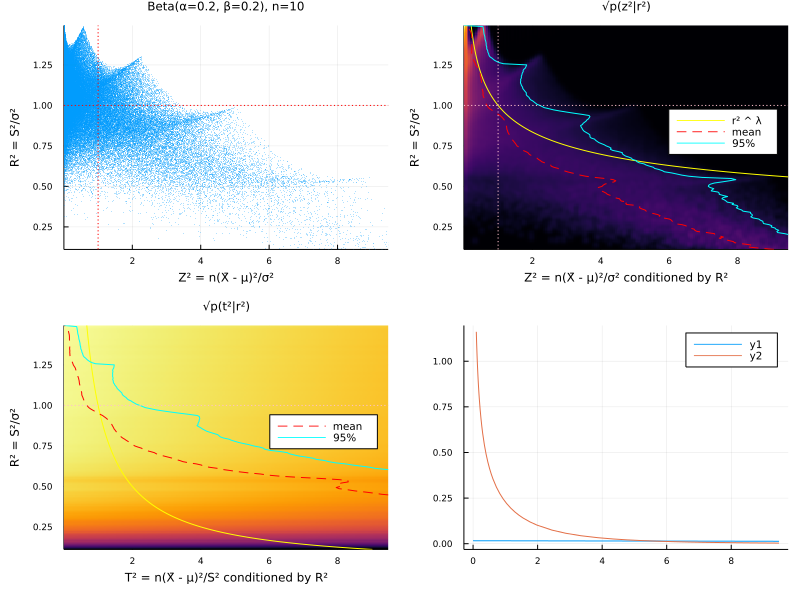

In [383]:
plotZR(; dist=Beta(0.2, 0.2), n = 10)

1000000 samples with size n = 20 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 2.1146,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0521
Z²lim = quantile.(Ref(Z²), Z²span) = (1.560889684002011e-6, 10.169174383574795)
R²lim = quantile.(Ref(R²), R²span) = (0.4976048572783916, 1.3363507418975717)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0004950501680663, 1.3836636378251421, 1.3826657968874305)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999197493307889, 0.13065489550955028, 0.1304908570632049)
(cov(Z², R²), κ₄ / n) = (-0.0884743821623072, -0.08823529411764706)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (-5.182820461064086, -5.181818181818186)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (1.2692721397397657, 0.8682596355985741, 0.10526315789473684)


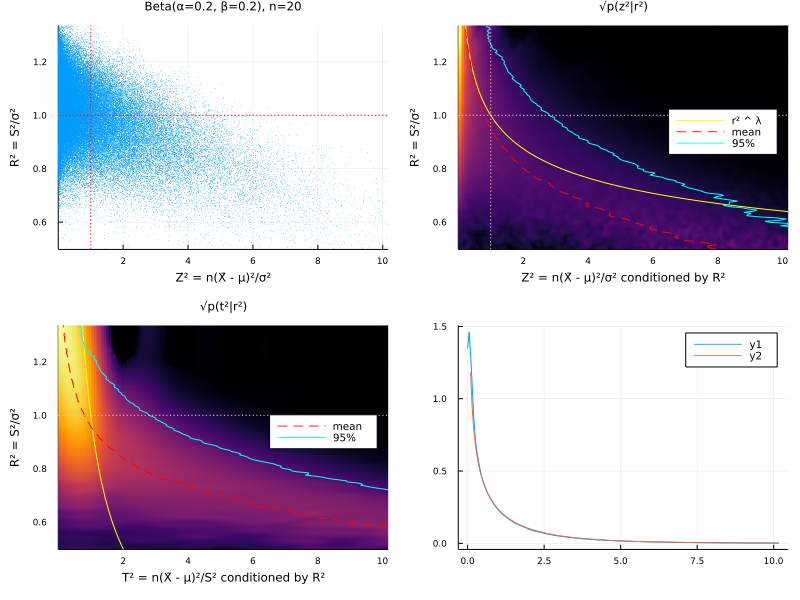

In [384]:
plotZR(; dist=Beta(0.2, 0.2), n = 20)

1000000 samples with size n = 40 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 2.0317,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.051
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5849050659297365e-6, 10.607549336900297)
R²lim = quantile.(Ref(R²), R²span) = (0.7024894218201179, 1.2348947625452094)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0027362078127482, 1.402793802504754, 1.3985286385845577)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9998887300428021, 0.08470326383181036, 0.0846428037297191)
(cov(Z², R²), κ₄ / n) = (-0.04450576834379113, -0.04411764705882353)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (-6.203203273079861, -6.15789473684211)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (1.1601950628832944, 0.4665187590720563, 0.05128205128205128)


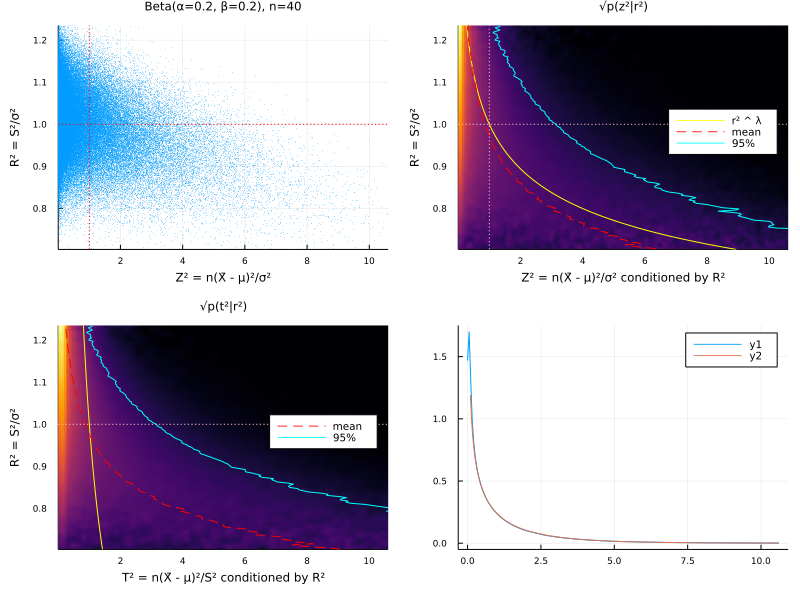

In [385]:
plotZR(; dist=Beta(0.2, 0.2), n = 40)

1000000 samples with size n = 160 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 1.9787,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0504
Z²lim = quantile.(Ref(Z²), Z²span) = (1.4762281357048352e-6, 10.818067222104153)
R²lim = quantile.(Ref(R²), R²span) = (0.8736162745440934, 1.1165302973072266)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0013481041894248, 1.4145798040915132, 1.4103086854427629)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0000299329137423, 0.03938600250655157, 0.03935993632483893)
(cov(Z², R²), κ₄ / n) = (-0.011050933311978244, -0.011029411764705883)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (-7.123856288091608, -7.119402985074627)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (1.0453735996355733, 0.11102410443844465, 0.012578616352201259)


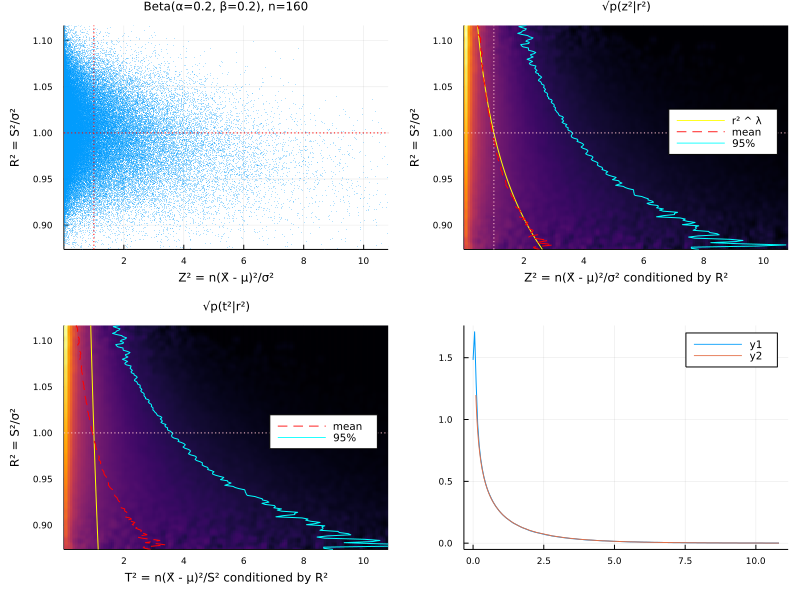

In [386]:
plotZR(; dist=Beta(0.2, 0.2), n = 160)

1000000 samples with size n = 10 of TDist(ν=5.0)
skewness, kurtosis = 0.0, 6.0
√quantile(T², 0.95) = 2.2012,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0448
Z²lim = quantile.(Ref(Z²), Z²span) = (1.3991163437205893e-6, 14.25046217389731)
R²lim = quantile.(Ref(R²), R²span) = (0.09228018679230586, 8.523971081615015)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9992697127024793, 1.6009930541168813, 1.61245154965971)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9998362919528645, 0.8822232253769208, 0.9067647005823629)
(cov(Z², R²), κ₄ / n) = (0.5545945409173091, 0.6)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7125553688964642, 0.7297297297297297)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (0.9558254289350772, 0.033017362593377744, 0.2222222222222222)


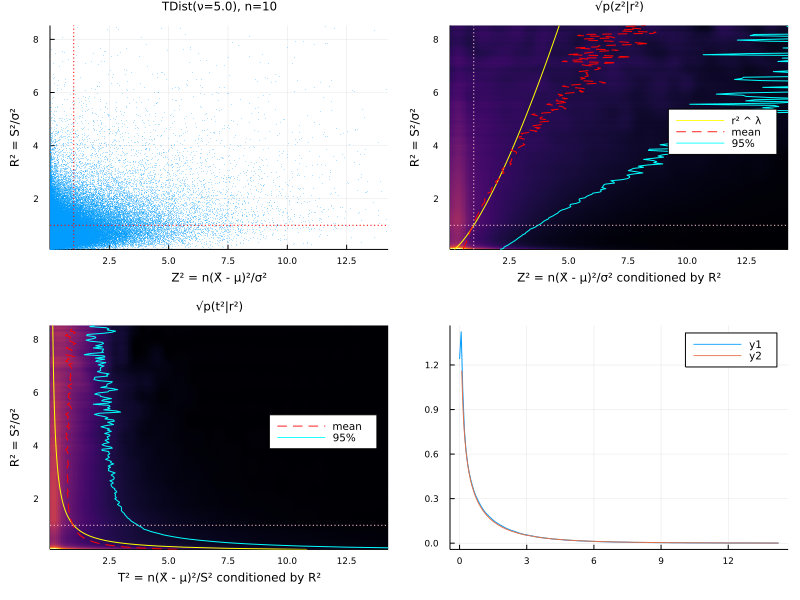

In [387]:
plotZR(; dist=TDist(5), n = 10)

1000000 samples with size n = 40 of TDist(ν=5.0)
skewness, kurtosis = 0.0, 6.0
√quantile(T², 0.95) = 2.008,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0484
Z²lim = quantile.(Ref(Z²), Z²span) = (1.7110520929214785e-6, 11.786253729084516)
R²lim = quantile.(Ref(R²), R²span) = (0.3380548854157572, 4.279748728271456)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9984167596499982, 1.460621850398882, 1.466287829861518)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9995988227051962, 0.42957612724372984, 0.44864468266329793)
(cov(Z², R²), κ₄ / n) = (0.13456451946928694, 0.15)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7292060917618582, 0.7452229299363057)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (0.9868009394513431, 0.009228340962170864, 0.05128205128205128)


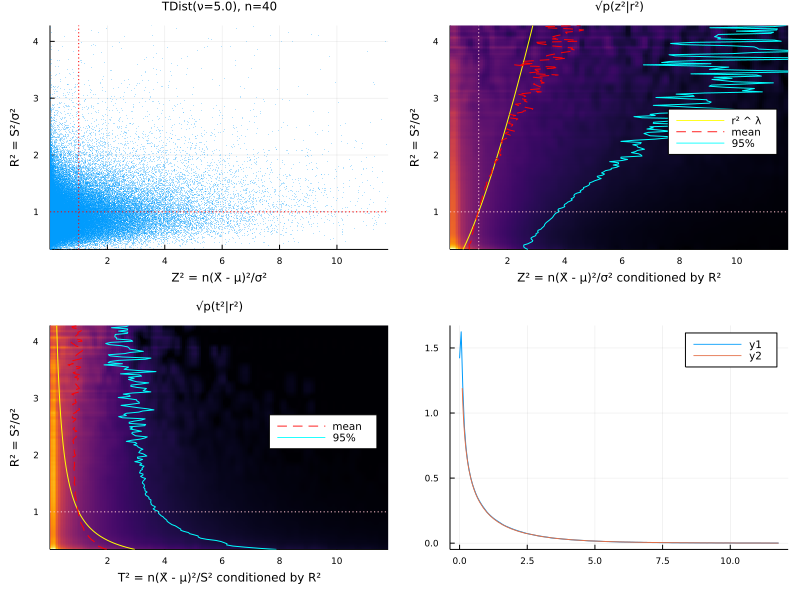

In [388]:
plotZR(; dist=TDist(5), n = 40)

1000000 samples with size n = 160 of TDist(ν=5.0)
skewness, kurtosis = 0.0, 6.0
√quantile(T², 0.95) = 1.9696,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0494
Z²lim = quantile.(Ref(Z²), Z²span) = (1.636854360536822e-6, 11.112470683142723)
R²lim = quantile.(Ref(R²), R²span) = (0.5809167171780095, 2.496831681862756)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.000389240671976, 1.4277419963009377, 1.4274102423620199)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9998064214072129, 0.2177886957452124, 0.22378252021147957)
(cov(Z², R²), κ₄ / n) = (0.03397841043419519, 0.0375)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.716361751825634, 0.748822605965463)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (0.9959778540861671, 0.0030465740176798665, 0.012578616352201259)


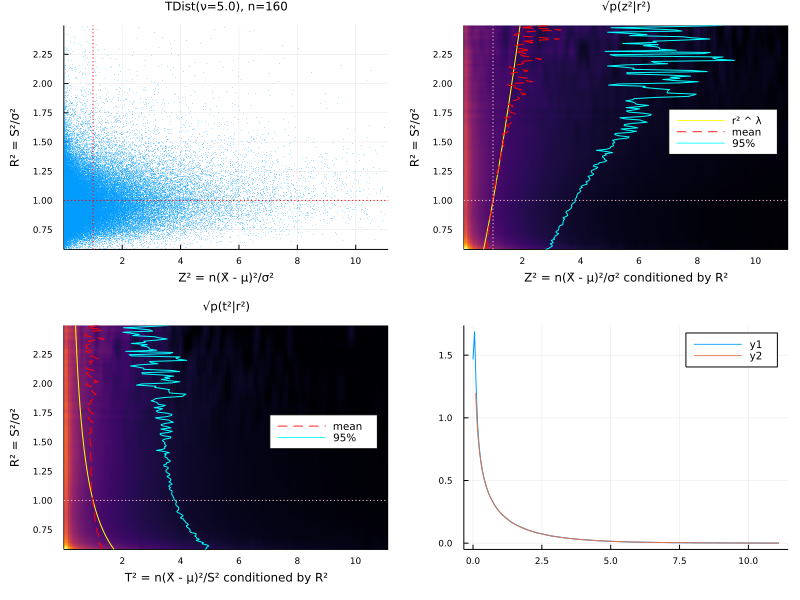

In [389]:
plotZR(; dist=TDist(5), n = 160)

1000000 samples with size n = 640 of TDist(ν=5.0)
skewness, kurtosis = 0.0, 6.0
√quantile(T², 0.95) = 1.9621,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0498
Z²lim = quantile.(Ref(Z²), Z²span) = (1.4398149747690744e-6, 10.862053156247812)
R²lim = quantile.(Ref(R²), R²span) = (0.7542156756884868, 1.6712990195652078)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9993819045048148, 1.4145632193306716, 1.4175242502334837)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0000704589985958, 0.1093692347379703, 0.1118252675106754)
(cov(Z², R²), κ₄ / n) = (0.008912059464075786, 0.009375)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.745053962650683, 0.7497066875244427)
(mean(R² .^ (1 - λ)), var(R² .^ (1 - λ)), 2 / (n - 1)) = (0.9989838870820383, 0.0006943449865292945, 0.003129890453834116)


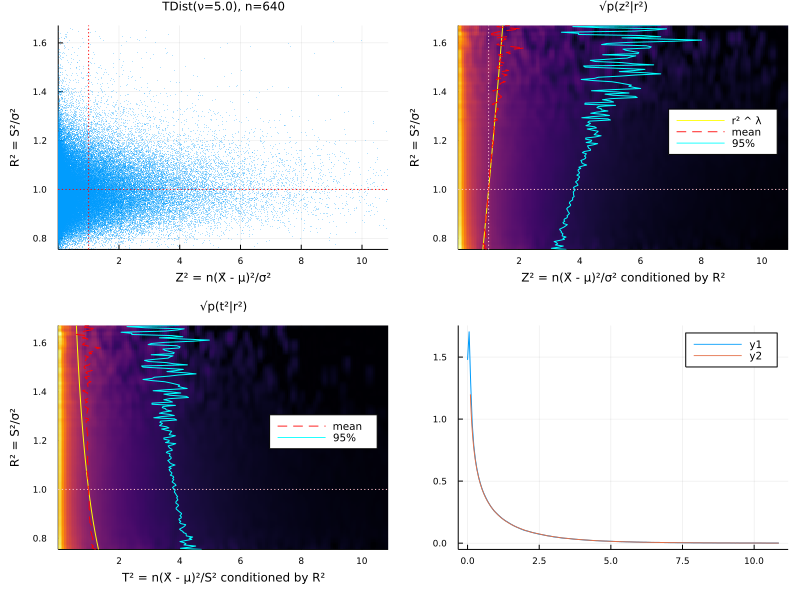

In [390]:
plotZR(; dist=TDist(5), n = 640)

1000000 samples with size n = 10 of Laplace(μ=0.0, θ=1.0)
skewness, kurtosis = 0.0, 3.0
√quantile(T², 0.95) = 2.1716,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0421
Z²lim = quantile.(Ref(Z²), Z²span) = (1.4460484071277622e-6, 12.642353245615508)
R²lim = quantile.(Ref(R²), R²span) = (0.06619478839810501, 5.632814981035646)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0001009658856614, 1.5154387638373379, 1.51657508881031)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9997386673453227, 0.722173715842953, 0.7226494462892933)
(cov(Z², R²), κ₄ / n) = (0.2984830323453754, 0.3)
λ₁ = 0.5723165336860315
-1 + λ₁ = -0.4276834663139685
-λ₂ = -1.532970971675589


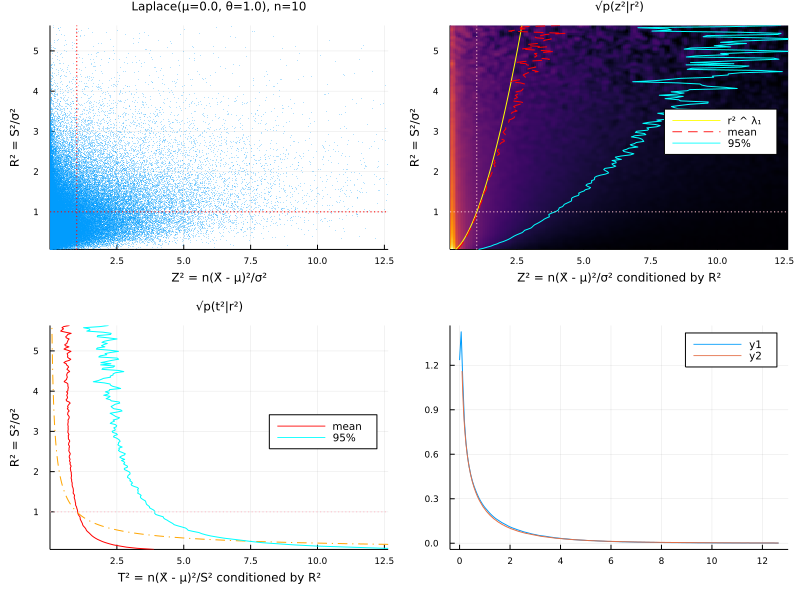

In [458]:
plotZR(; dist=Laplace(), n = 10)

1000000 samples with size n = 40 of Laplace(μ=0.0, θ=1.0)
skewness, kurtosis = 0.0, 3.0
√quantile(T², 0.95) = 2.0113,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0487
Z²lim = quantile.(Ref(Z²), Z²span) = (1.4885389183424662e-6, 11.22269828099136)
R²lim = quantile.(Ref(R²), R²span) = (0.30285734593953756, 2.7188672914790417)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0019110861824294, 1.4437782726813986, 1.4404860290887933)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0002545579366018, 0.35546719700066176, 0.3553618596333198)
(cov(Z², R²), κ₄ / n) = (0.07509821659560921, 0.075)
λ₁ = 0.5943339846812195
-1 + λ₁ = -0.40566601531878055
-λ₂ = -1.5692354826475214


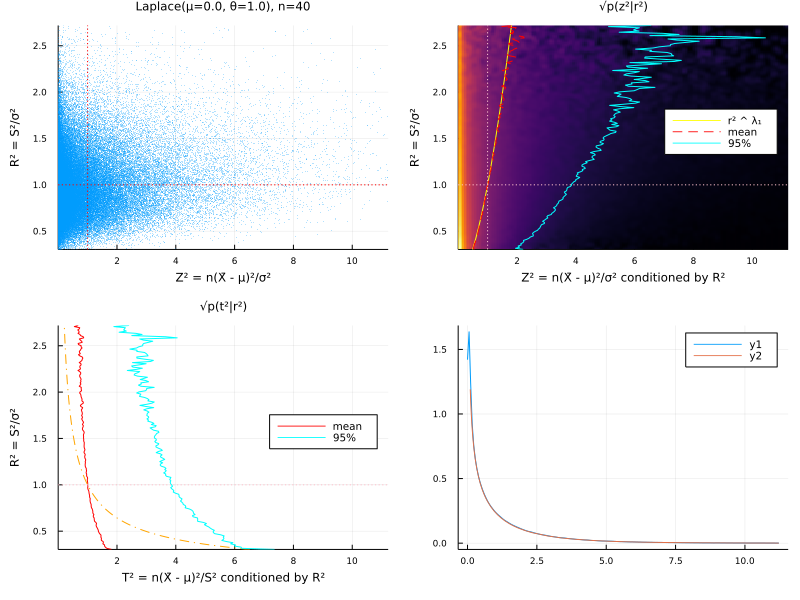

In [459]:
plotZR(; dist=Laplace(), n = 40)

1000000 samples with size n = 160 of Laplace(μ=0.0, θ=1.0)
skewness, kurtosis = 0.0, 3.0
√quantile(T², 0.95) = 1.9725,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0497
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5241749392599713e-6, 10.992956418418167)
R²lim = quantile.(Ref(R²), R²span) = (0.5675481671718874, 1.6969800175517245)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9989815568621049, 1.4225109742687945, 1.4208272238382822)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.000055949704748, 0.1768582223161368, 0.17699891624583824)
(cov(Z², R²), κ₄ / n) = (0.018595621414678132, 0.01875)
λ₁ = 0.5945113975995616
-1 + λ₁ = -0.4054886024004384
-λ₂ = -1.5781714102086628


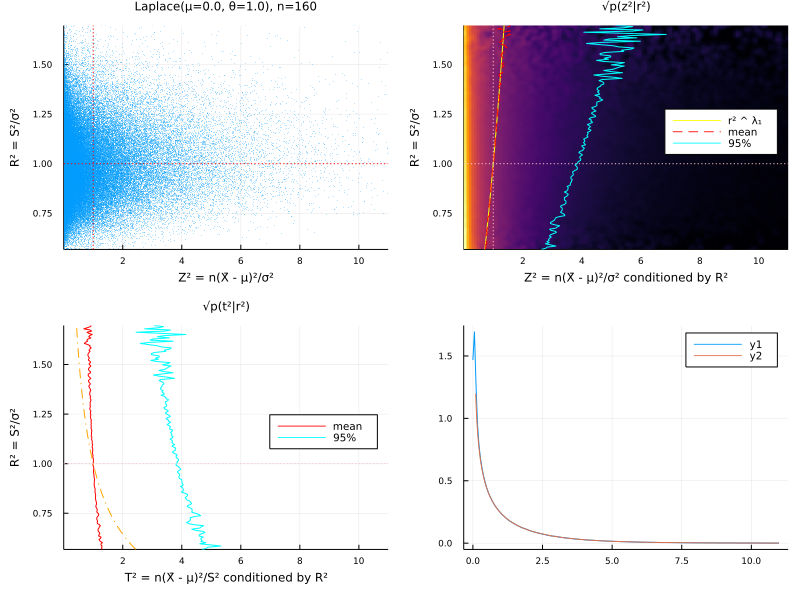

In [460]:
plotZR(; dist=Laplace(), n = 160)

1000000 samples with size n = 640 of Laplace(μ=0.0, θ=1.0)
skewness, kurtosis = 0.0, 3.0
√quantile(T², 0.95) = 1.9612,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0497
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5522528069327078e-6, 10.793439054595352)
R²lim = quantile.(Ref(R²), R²span) = (0.7567041966677748, 1.3079591786467313)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9987207719860973, 1.4131346732212595, 1.415869873964412)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0000529241737377, 0.0884603953713688, 0.08841600790487046)
(cov(Z², R²), κ₄ / n) = (0.004561703968554751, 0.0046875)
λ₁ = 0.5829473684408861
-1 + λ₁ = -0.4170526315591139
-λ₂ = -1.5803974974670139


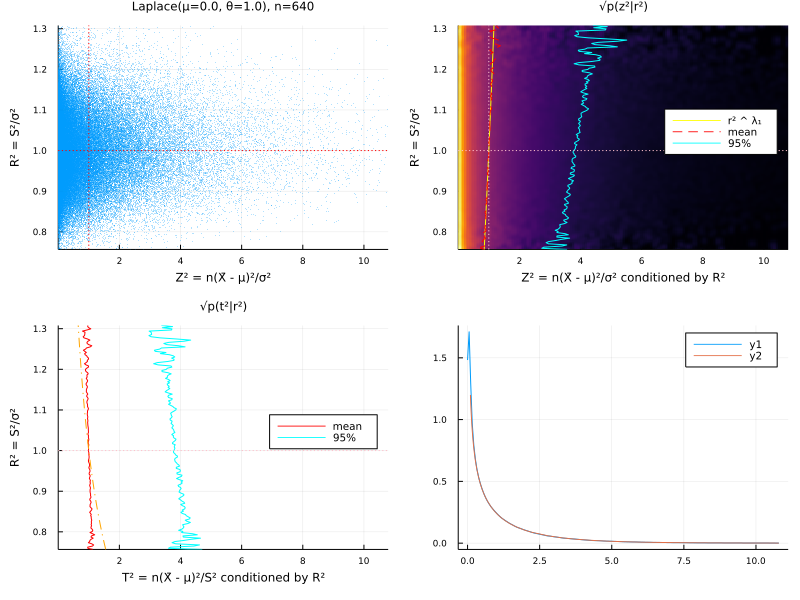

In [461]:
plotZR(; dist=Laplace(), n = 640)

1000000 samples with size n = 10 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.4011,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0604
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5401187334561884e-6, 12.443030322750493)
R²lim = quantile.(Ref(R²), R²span) = (0.10932387031225156, 4.389356803705604)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0011118419907854, 1.4591909794920417, 1.4560219778561037)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0008796215406135, 0.585268414035155, 0.5849976258261415)
(cov(Z², R²), κ₄ / n) = (0.1229015516690634, 0.12)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.35879566963507, 0.35064935064935066)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.8054259011528966, 0.2222222222222222)


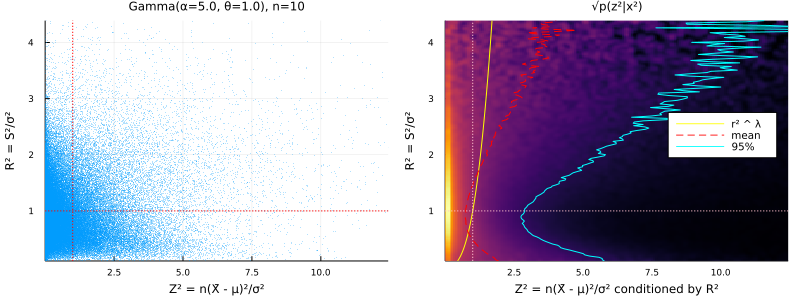

In [278]:
plotZR(; dist=Gamma(5,1), n = 10)

1000000 samples with size n = 40 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.0575,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0535
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5913407430081197e-6, 11.171602003253286)
R²lim = quantile.(Ref(R²), R²span) = (0.39003925811284446, 2.2834275245748015)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9996896714390286, 1.4259628188260245, 1.4247806848775006)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999883391344797, 0.28545206096241704, 0.2851000723992389)
(cov(Z², R²), κ₄ / n) = (0.03134531570748311, 0.03)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.3846859125590754, 0.36908517350157727)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.16839680085482406, 0.05128205128205128)


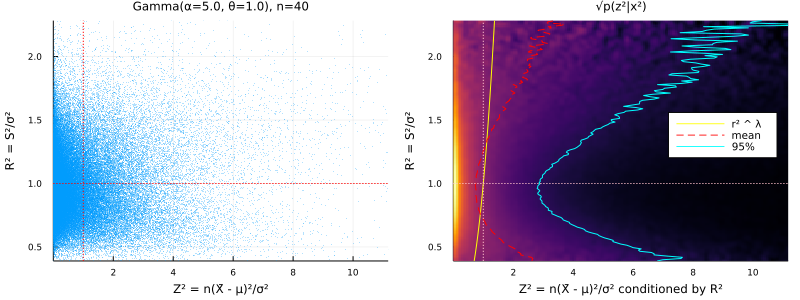

In [279]:
plotZR(; dist=Gamma(5,1), n = 40)

1000000 samples with size n = 160 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9855,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0512
Z²lim = quantile.(Ref(Z²), Z²span) = (1.7123896899438387e-6, 10.968822833240425)
R²lim = quantile.(Ref(R²), R²span) = (0.6385865045030158, 1.5319626620352804)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0007802380802848, 1.4178960011024255, 1.4168627315304754)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999438584686923, 0.14160761213134576, 0.1416990344081471)
(cov(Z², R²), κ₄ / n) = (0.007428213759130605, 0.0075)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.3704343006803253, 0.37353171495693027)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.03836413232642232, 0.012578616352201259)


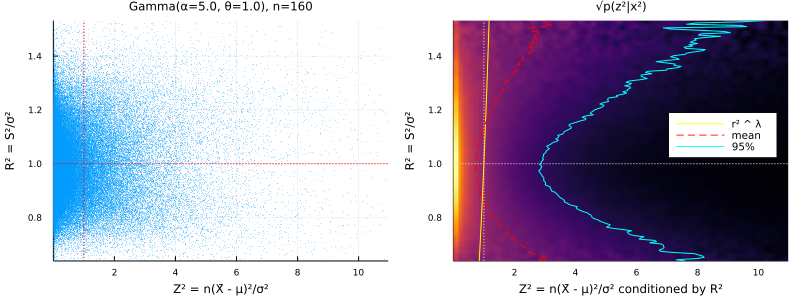

In [280]:
plotZR(; dist=Gamma(5,1), n = 160)

1000000 samples with size n = 640 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9667,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0504
Z²lim = quantile.(Ref(Z²), Z²span) = (1.364636944717173e-6, 10.798394935778903)
R²lim = quantile.(Ref(R²), R²span) = (0.8000928998623091, 1.241472353668662)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9997788645314775, 1.4136231091459568, 1.4148763196831022)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999933119421622, 0.07069060907365358, 0.07074525039770596)
(cov(Z², R²), κ₄ / n) = (0.0015698058230466552, 0.001875)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.3141394568955557, 0.3746335743599765)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.008662381293458825, 0.003129890453834116)


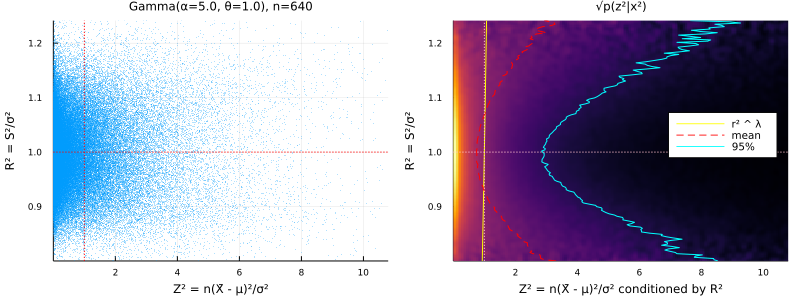

In [281]:
plotZR(; dist=Gamma(5,1), n = 640)

1000000 samples with size n = 10 of Gamma(α=20.0, θ=1.0)
skewness, kurtosis = 0.4472, 0.3
√quantile(T², 0.95) = 2.3,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.053
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5690578496365997e-6, 11.168415496140796)
R²lim = quantile.(Ref(R²), R²span) = (0.12350179104301048, 3.504071583364081)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9991893140648553, 1.4237511291364657, 1.4247806848775006)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.00059372539484, 0.5023108620378876, 0.5022173057773122)
(cov(Z², R²), κ₄ / n) = (0.028362987636414195, 0.03)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.11241048889434738, 0.11894273127753303)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.32445430158605004, 0.2222222222222222)


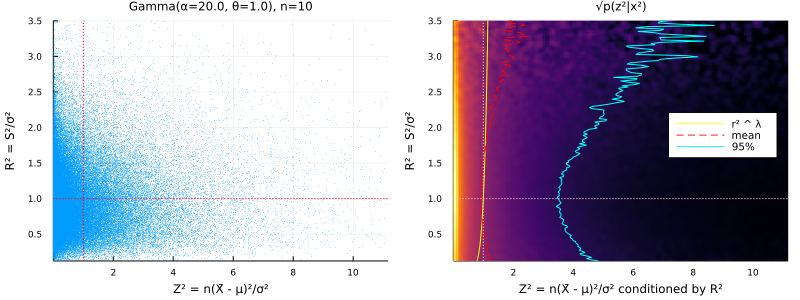

In [282]:
plotZR(; dist=Gamma(20,1), n = 10)

1000000 samples with size n = 40 of Gamma(α=20.0, θ=1.0)
skewness, kurtosis = 0.4472, 0.3
√quantile(T², 0.95) = 2.0329,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0511
Z²lim = quantile.(Ref(Z²), Z²span) = (1.592184728753956e-6, 10.917291417858795)
R²lim = quantile.(Ref(R²), R²span) = (0.43096121457119185, 1.9705626105514515)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.002972592335242, 1.418958858147458, 1.4168627315304754)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9998980392759081, 0.24245954030697092, 0.2424501006022709)
(cov(Z², R²), κ₄ / n) = (0.0075256788656558795, 0.0075)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.12801684726419865, 0.12758996728462377)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.0756726032653852, 0.05128205128205128)


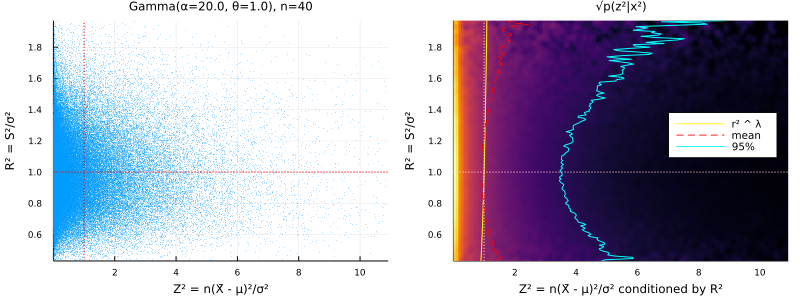

In [283]:
plotZR(; dist=Gamma(20,1), n = 40)

1000000 samples with size n = 160 of Gamma(α=20.0, θ=1.0)
skewness, kurtosis = 0.4472, 0.3
√quantile(T², 0.95) = 1.9741,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0499
Z²lim = quantile.(Ref(Z²), Z²span) = (1.6473862720180347e-6, 10.847655557762314)
R²lim = quantile.(Ref(R²), R²span) = (0.6751308219827755, 1.4241891351166729)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9993180111929527, 1.4151409472513747, 1.4148763196831022)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999569736343759, 0.12017396396581145, 0.12022319390284579)
(cov(Z², R²), κ₄ / n) = (0.0017365796179860573, 0.001875)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.12024691026705128, 0.12972531955398423)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.018172461122345416, 0.012578616352201259)


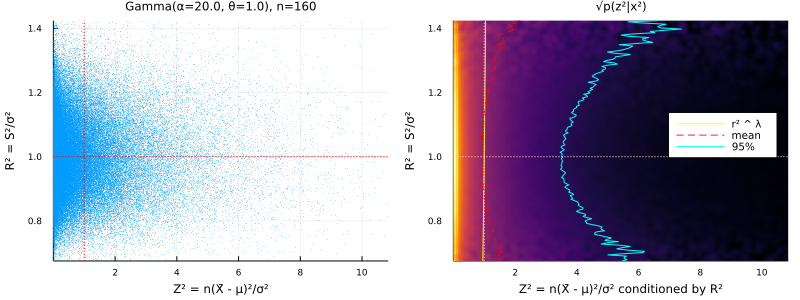

In [284]:
plotZR(; dist=Gamma(20,1), n = 160)

1000000 samples with size n = 640 of Gamma(α=20.0, θ=1.0)
skewness, kurtosis = 0.4472, 0.3
√quantile(T², 0.95) = 1.9626,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0499
Z²lim = quantile.(Ref(Z²), Z²span) = (1.6461463781411499e-6, 10.959149355727225)
R²lim = quantile.(Ref(R²), R²span) = (0.8273463795507299, 1.1985118430445458)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (0.9996540480765161, 1.4182685176240486, 1.4143792808154396)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.9999818554787726, 0.060027795793279194, 0.059988669378759484)
(cov(Z², R²), κ₄ / n) = (0.00034670179719944555, 0.00046875)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.09621688663854805, 0.13025752531086499)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.004332565550980222, 0.003129890453834116)


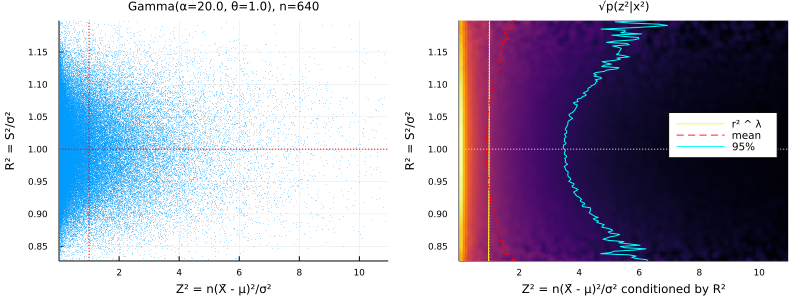

In [285]:
plotZR(; dist=Gamma(20,1), n = 640)

1000000 samples with size n = 10 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 3.1406,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0995
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5408695159990751e-6, 16.087752865491577)
R²lim = quantile.(Ref(R²), R²span) = (0.04408418778303578, 7.78027878035114)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.000445250974835, 1.615512835832965, 1.61245154965971)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0002222021081202, 0.9084773413847705, 0.9067647005823629)
(cov(Z², R²), κ₄ / n) = (0.6032362464687119, 0.6)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7309021327633981, 0.7297297297297297)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (9.454446406263813, 0.2222222222222222)


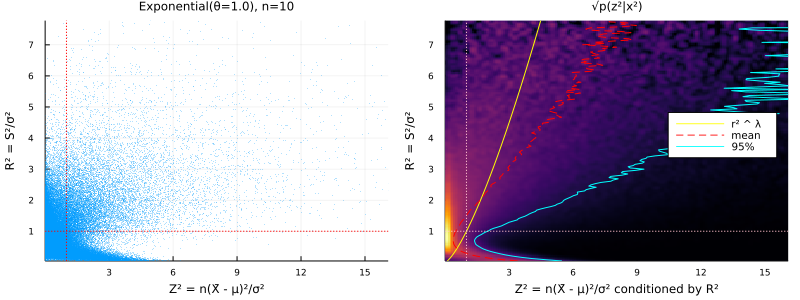

In [286]:
plotZR(; dist=Exponential(), n = 10)

1000000 samples with size n = 40 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.2248,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.068
Z²lim = quantile.(Ref(Z²), Z²span) = (1.5681569971596827e-6, 12.764716996881615)
R²lim = quantile.(Ref(R²), R²span) = (0.23817720811439994, 3.502424622991573)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0002904063236158, 1.4715423202802926, 1.466287829861518)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0000908135640563, 0.4486108171176692, 0.44864468266329793)
(cov(Z², R²), κ₄ / n) = (0.15157589574671756, 0.15)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7531659207377812, 0.7452229299363057)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.9902729780402447, 0.05128205128205128)


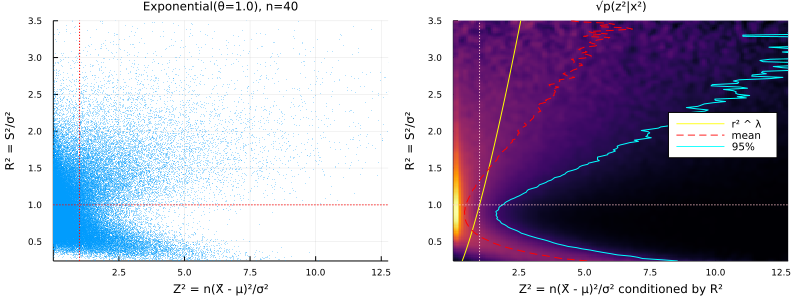

In [287]:
plotZR(; dist=Exponential(), n = 40)

1000000 samples with size n = 160 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.0216,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0551
Z²lim = quantile.(Ref(Z²), Z²span) = (1.496865939742201e-6, 11.333426513076894)
R²lim = quantile.(Ref(R²), R²span) = (0.4973725058269478, 1.9812657516628565)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.001075781125015, 1.4305449976517348, 1.4274102423620199)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (1.0000235411438174, 0.22405379225828131, 0.22378252021147957)
(cov(Z², R²), κ₄ / n) = (0.038999113094310665, 0.0375)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7768731870309177, 0.748822605965463)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.18128792308094116, 0.012578616352201259)


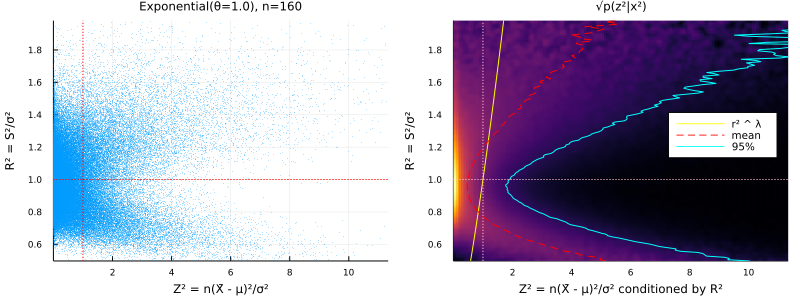

In [288]:
plotZR(; dist=Exponential(), n = 160)

1000000 samples with size n = 640 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 1.9774,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0516
Z²lim = quantile.(Ref(Z²), Z²span) = (1.56345340950401e-6, 10.91567275680057)
R²lim = quantile.(Ref(R²), R²span) = (0.7084857193864805, 1.4116074890153218)
(mean(Z²), std(Z²), √(κ₄ / n + 2)) = (1.0012637391032129, 1.4181287466343293, 1.4175242502334837)
(mean(R²), std(R²), √(κ₄ / n + 2 / (n - 1))) = (0.999968854825584, 0.11185614529918554, 0.1118252675106754)
(cov(Z², R²), κ₄ / n) = (0.009336776599472697, 0.009375)
(λ, (κ₄ / n) / (κ₄ / n + 2 / (n - 1))) = (0.7462378441310804, 0.7497066875244427)
(var(R² .^ (1 + λ)), 2 / (n - 1)) = (0.03939536437864718, 0.003129890453834116)


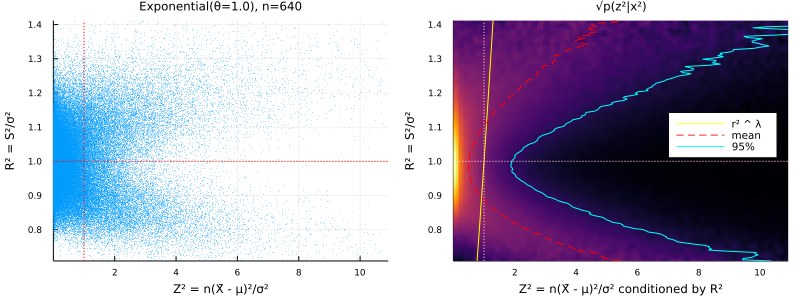

In [289]:
plotZR(; dist=Exponential(), n = 640)

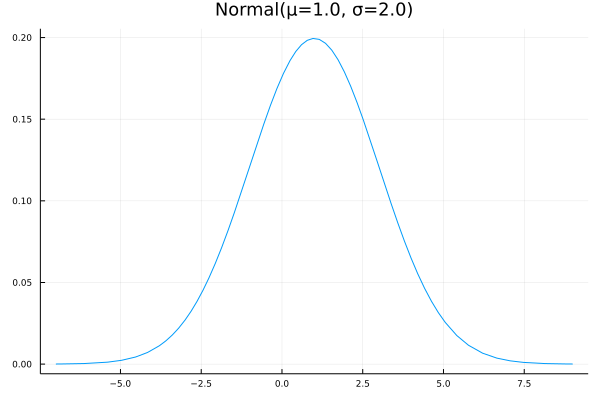

In [161]:
dist = Normal(1, 2); plot(dist, -7, 9; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of Normal(μ=1.0, σ=2.0)
skewness, kurtosis = 0.0, 0.0
√quantile(T², 0.95) = 2.2627,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0501


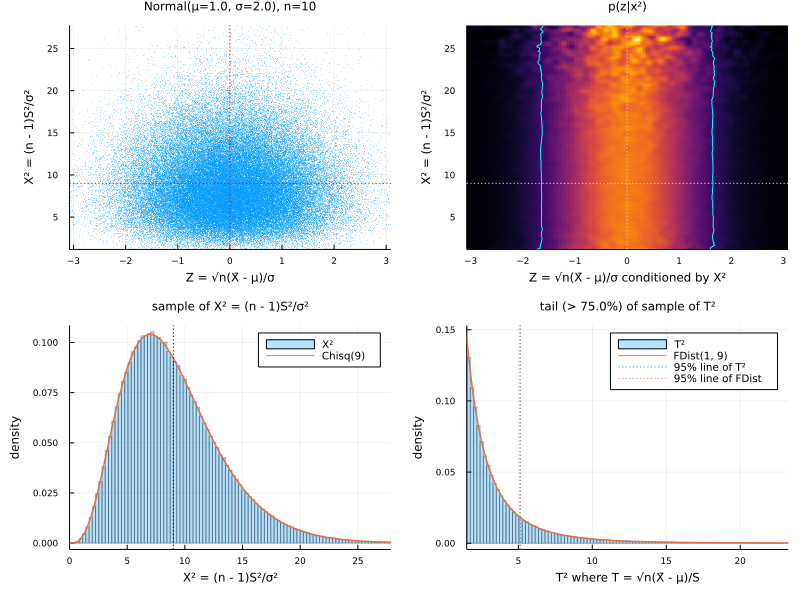

In [4]:
plot_samplestats(dist = Normal(1, 2), n = 10)

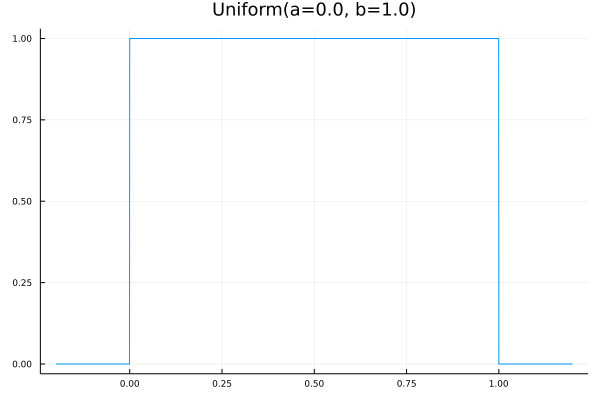

In [4]:
dist = Uniform(); plot(dist, -0.2, 1.2; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 2.316,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0542


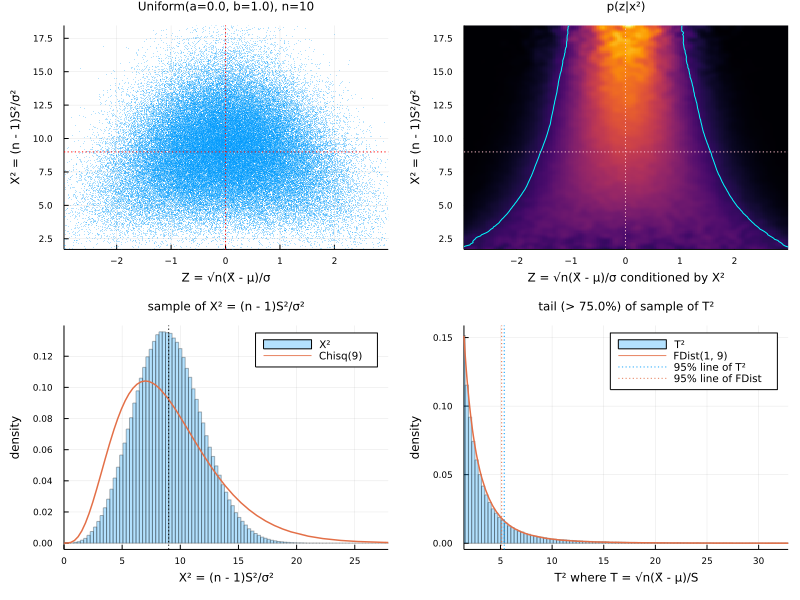

In [5]:
plot_samplestats(dist = Uniform(), n = 10)

1000000 samples with size n = 20 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 2.108,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0514


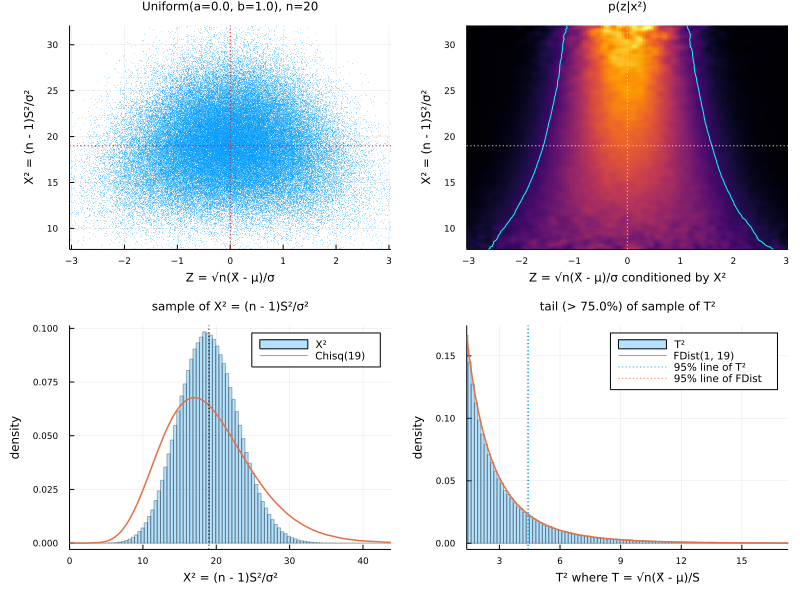

In [5]:
plot_samplestats(dist = Uniform(), n = 20)

1000000 samples with size n = 40 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 2.0269,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0504


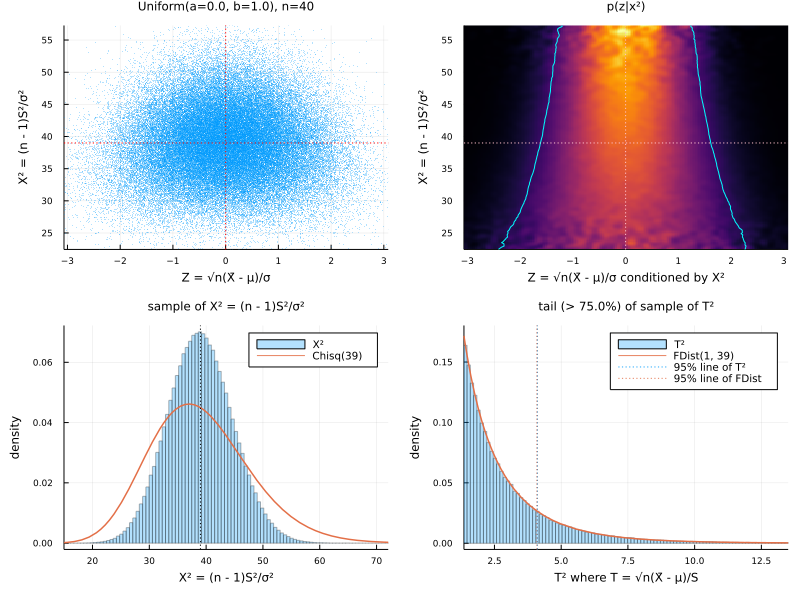

In [6]:
plot_samplestats(dist = Uniform(), n = 40)

1000000 samples with size n = 80 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9929,  
P(|T| > √quantile(FDist(1, 79), 0.95) = 1.9905) = 0.0503


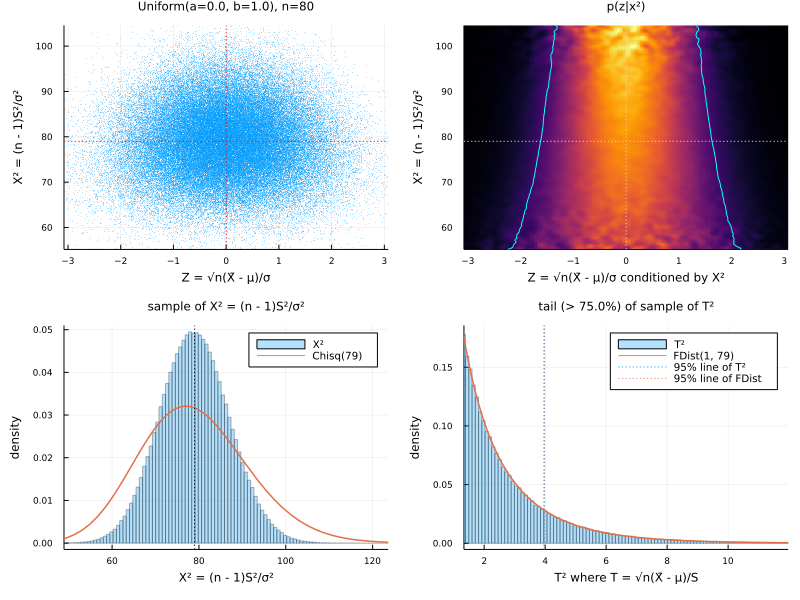

In [7]:
plot_samplestats(dist = Uniform(), n = 80)

1000000 samples with size n = 160 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9809,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0507


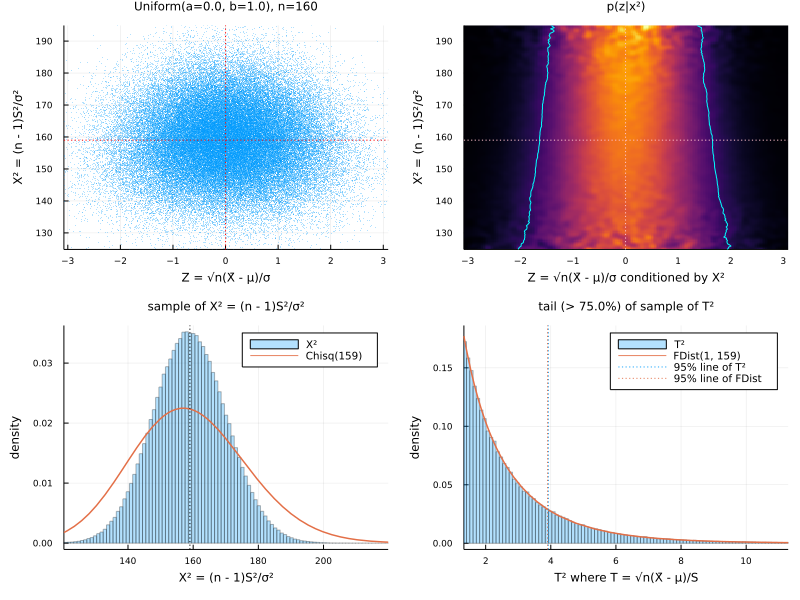

In [8]:
plot_samplestats(dist = Uniform(), n = 160)

1000000 samples with size n = 320 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9669,  
P(|T| > √quantile(FDist(1, 319), 0.95) = 1.9674) = 0.0499


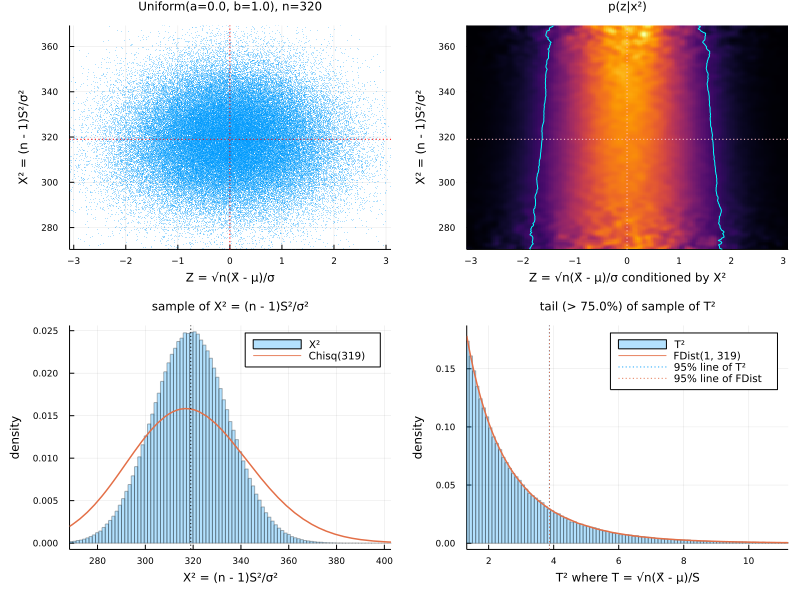

In [9]:
plot_samplestats(dist = Uniform(), n = 320)

1000000 samples with size n = 640 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9658,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0503


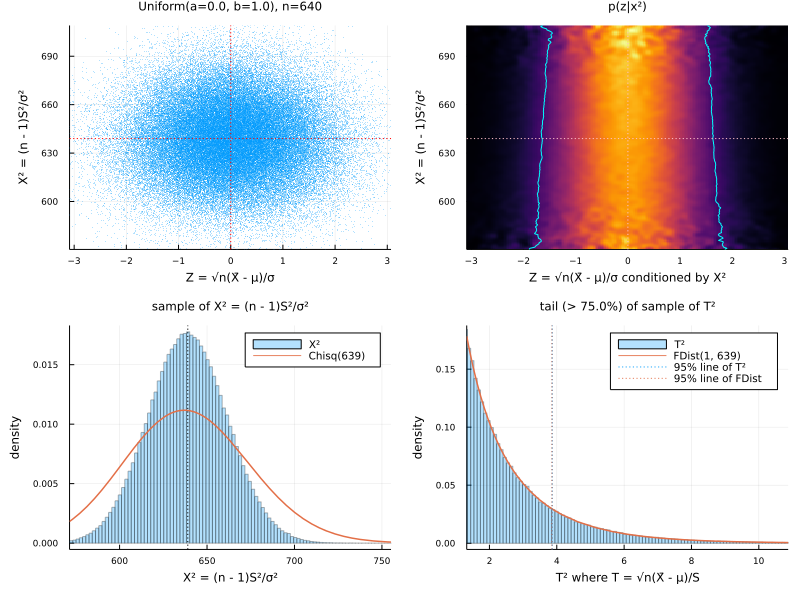

In [10]:
plot_samplestats(dist = Uniform(), n = 640)

1000000 samples with size n = 1280 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9611,  
P(|T| > √quantile(FDist(1, 1279), 0.95) = 1.9618) = 0.0499


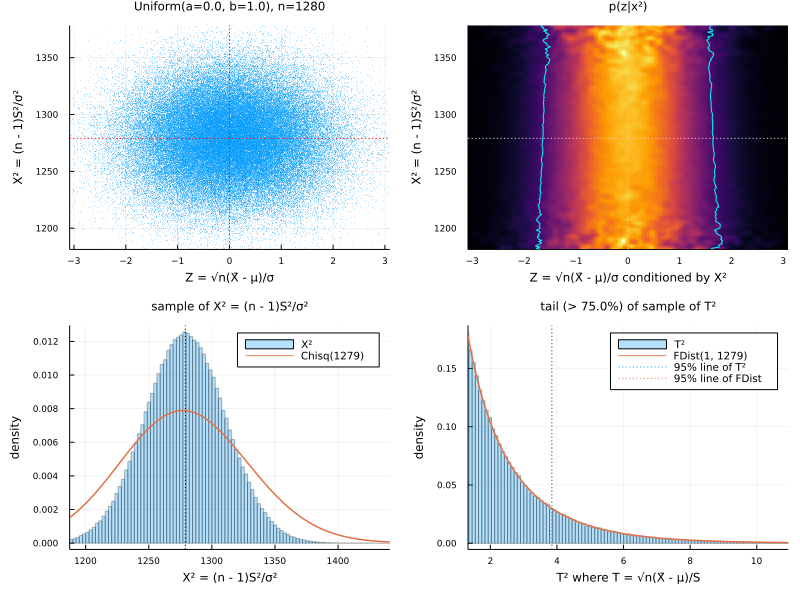

In [11]:
plot_samplestats(dist = Uniform(), n = 1280)

1000000 samples with size n = 2560 of Uniform(a=0.0, b=1.0)
skewness, kurtosis = 0.0, -1.2
√quantile(T², 0.95) = 1.9598,  
P(|T| > √quantile(FDist(1, 2559), 0.95) = 1.9609) = 0.0499


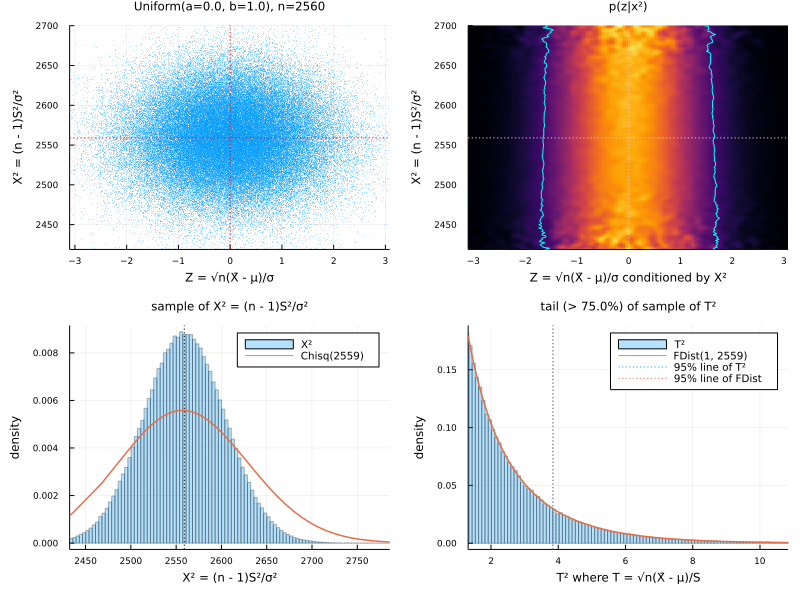

In [12]:
plot_samplestats(dist = Uniform(), n = 2560)

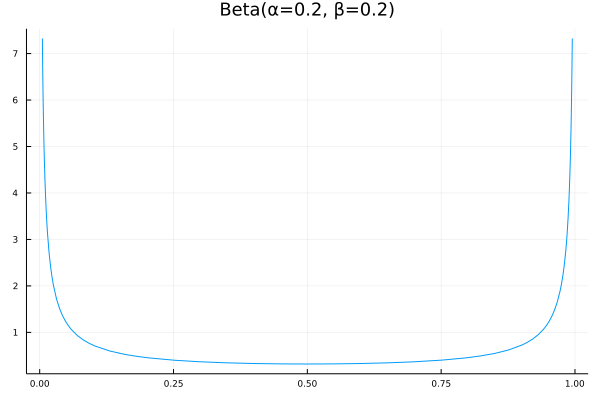

In [6]:
dist = Beta(0.2, 0.2); plot(dist, 0.005, 0.995; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 2.3185,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.054


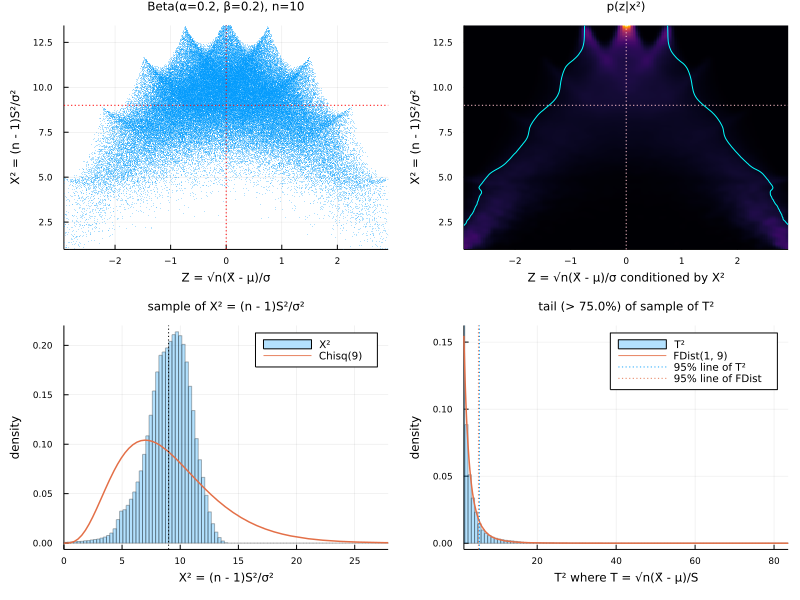

In [7]:
plot_samplestats(dist = Beta(0.2, 0.2), n = 10)

1000000 samples with size n = 20 of Beta(α=0.2, β=0.2)
skewness, kurtosis = 0.0, -1.7647
√quantile(T², 0.95) = 2.1094,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0515


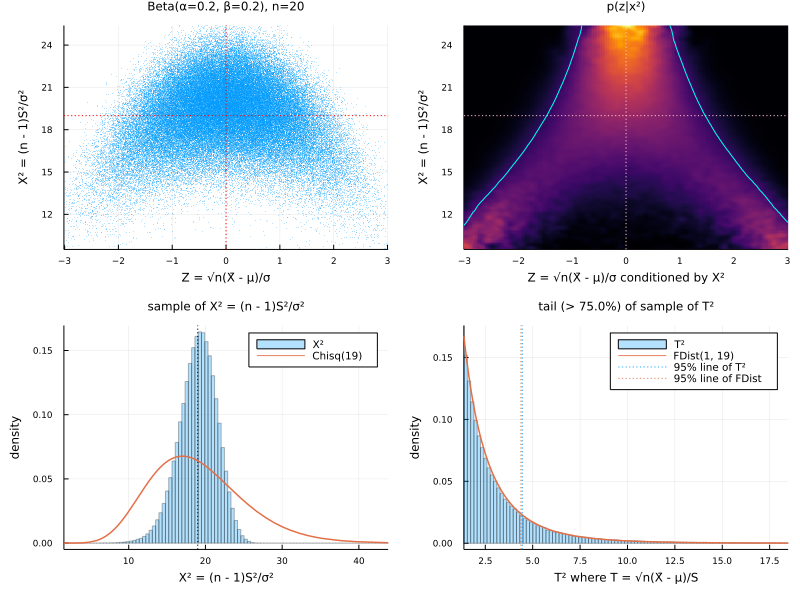

In [8]:
plot_samplestats(dist = Beta(0.2, 0.2), n = 20)

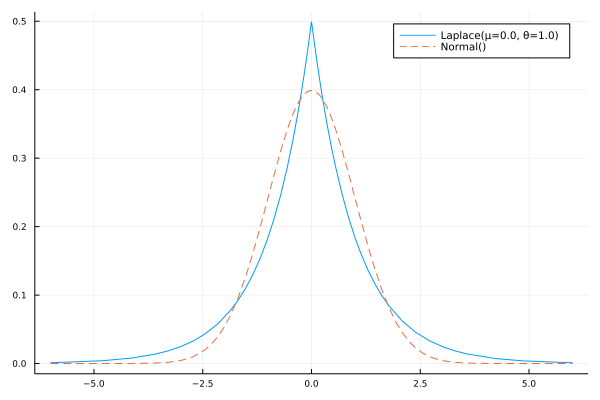

In [9]:
dist = Laplace(); plot(dist, -6, 6; label=name(dist))
plot!(Normal(), -6, 6; label="Normal()", ls=:dash)

1000000 samples with size n = 10 of Laplace(μ=0.0, θ=1.0)
skewness, kurtosis = 0.0, 3.0
√quantile(T², 0.95) = 2.1705,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0417


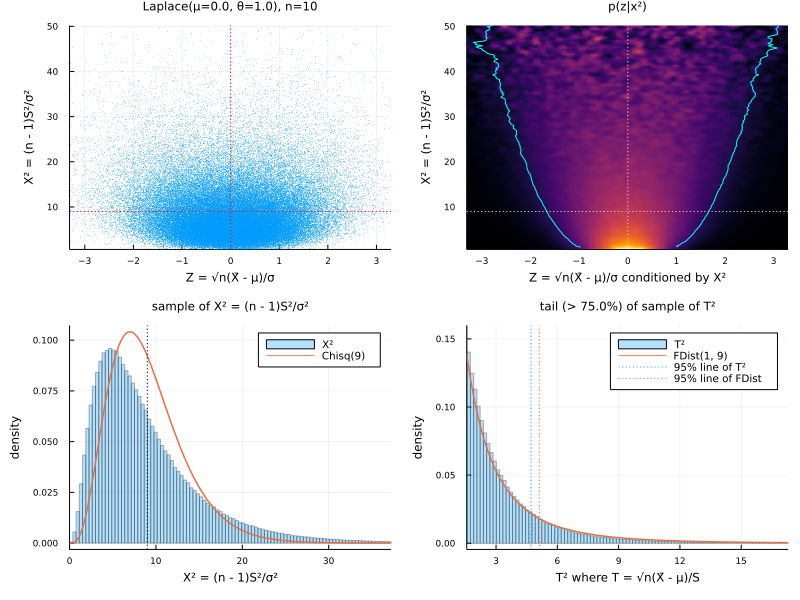

In [10]:
plot_samplestats(dist = Laplace(), L=10^6)

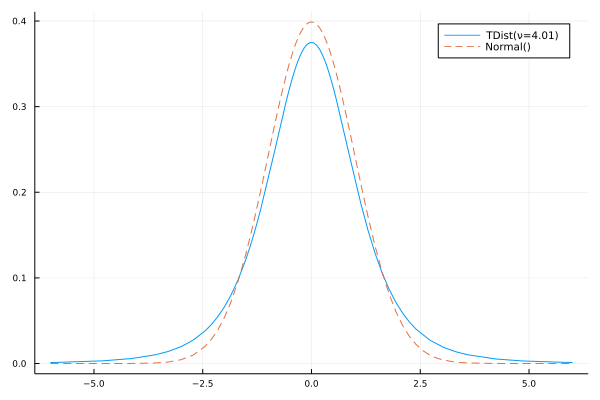

In [11]:
dist = TDist(4.01); plot(dist, -6, 6; label=name(dist))
plot!(Normal(), -6, 6; label="Normal()", ls=:dash)

1000000 samples with size n = 10 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 2.1857,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0435


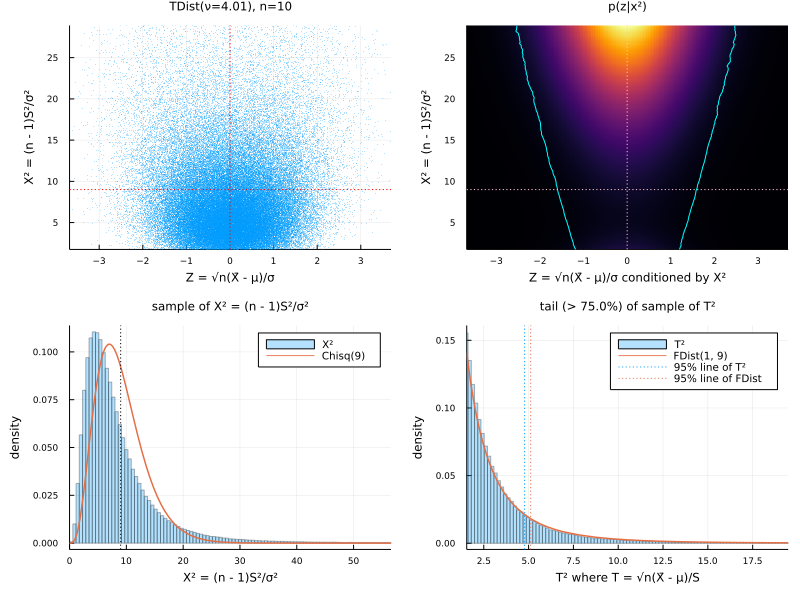

In [12]:
plot_samplestats(dist = TDist(4.01), L=10^6, X²span = (0.025, 0.975))

1000000 samples with size n = 20 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 2.054,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.046


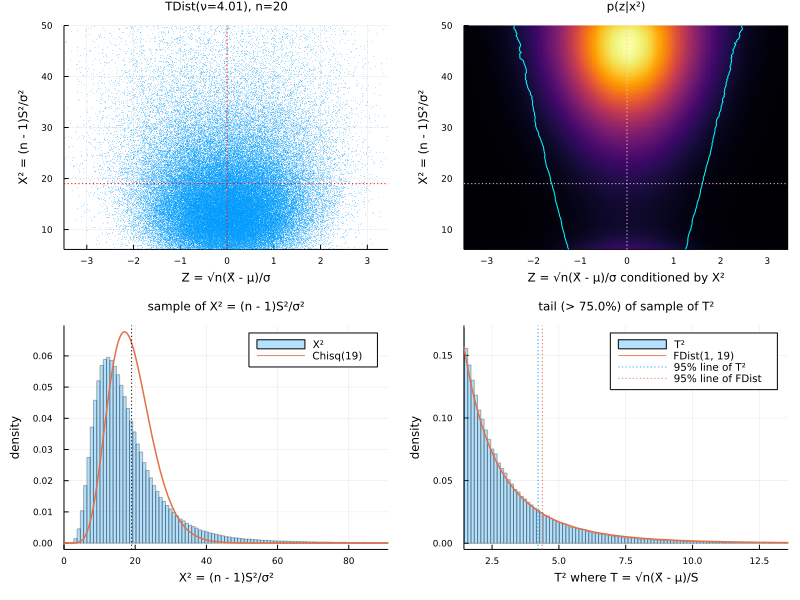

In [13]:
plot_samplestats(dist = TDist(4.01), n = 20, L=10^6, X²span = (0.025, 0.975))

1000000 samples with size n = 10 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 2.1812,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.043


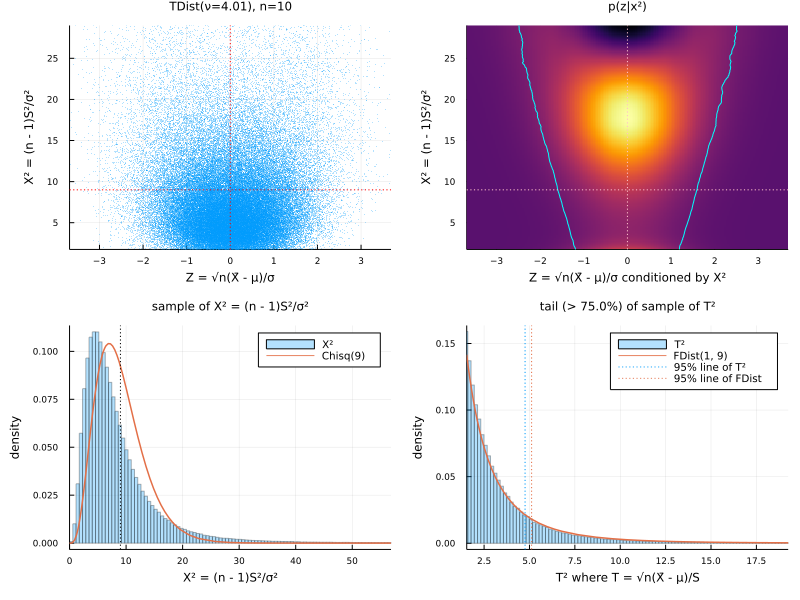

In [14]:
plot_samplestats(dist = TDist(4.01), L=10^6, X²span = (0.025, 0.975))

1000000 samples with size n = 10 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 2.1823,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0431


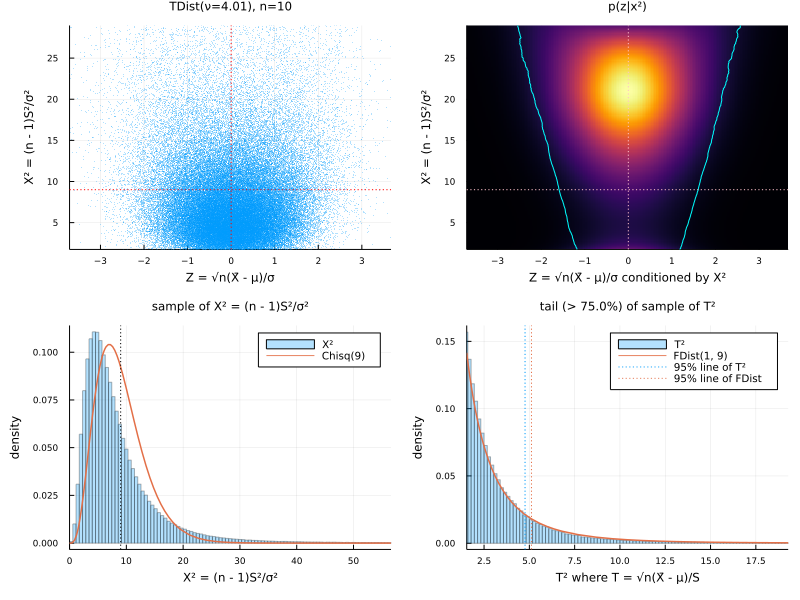

In [15]:
plot_samplestats(dist = TDist(4.01), L=10^6, X²span = (0.025, 0.975))

1000000 samples with size n = 160 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 1.9664,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.049


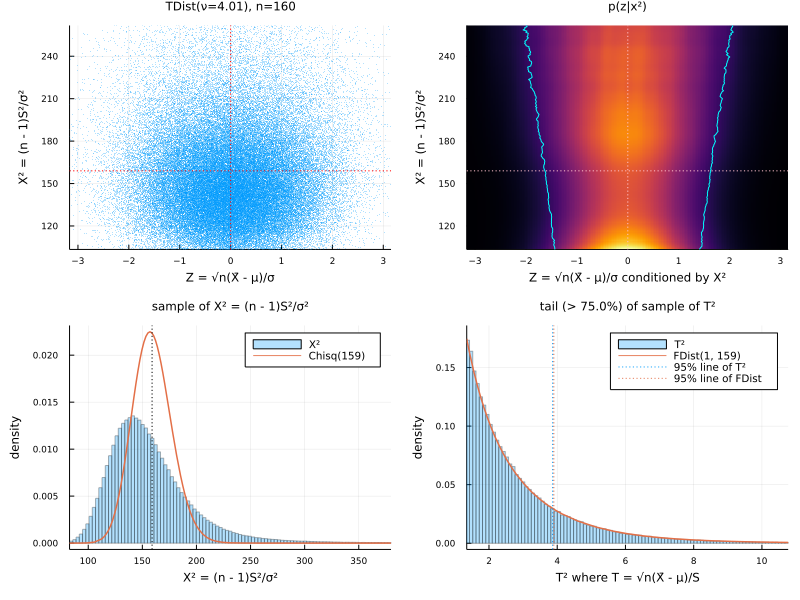

In [16]:
plot_samplestats(dist = TDist(4.01), n = 160, L=10^6, X²span = (0.025, 0.975))

1000000 samples with size n = 320 of TDist(ν=4.01)
skewness, kurtosis = 0.0, 600.0
√quantile(T², 0.95) = 1.9617,  
P(|T| > √quantile(FDist(1, 319), 0.95) = 1.9674) = 0.0493


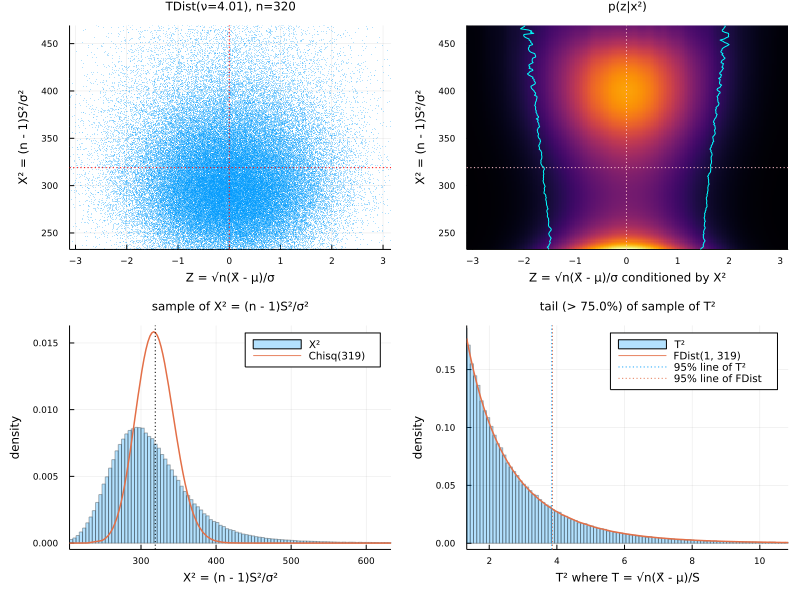

In [17]:
plot_samplestats(dist = TDist(4.01), n = 320, L = 10^6, X²span = (0.025, 0.975))

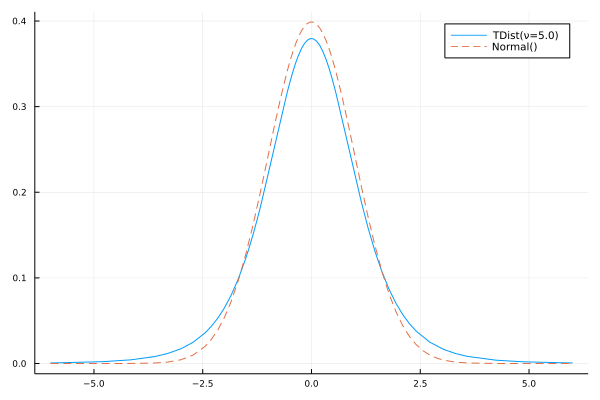

In [18]:
dist = TDist(5); plot(dist, -6, 6; label=name(dist))
plot!(Normal(), -6, 6; label="Normal()", ls=:dash)

1000000 samples with size n = 10 of TDist(ν=5.0)
skewness, kurtosis = 0.0, 6.0
√quantile(T², 0.95) = 2.2037,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.045


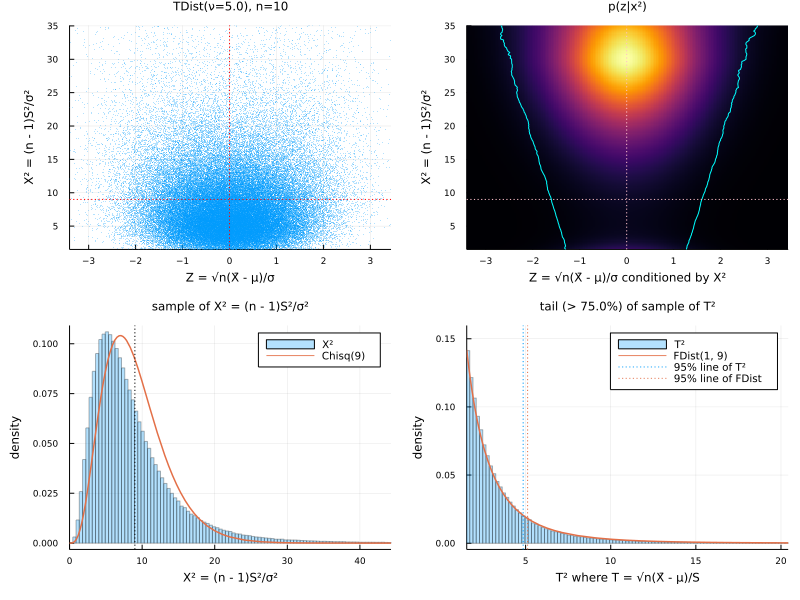

In [19]:
plot_samplestats(dist = TDist(5), n = 10, L = 10^6, X²span = (0.01, 0.99))

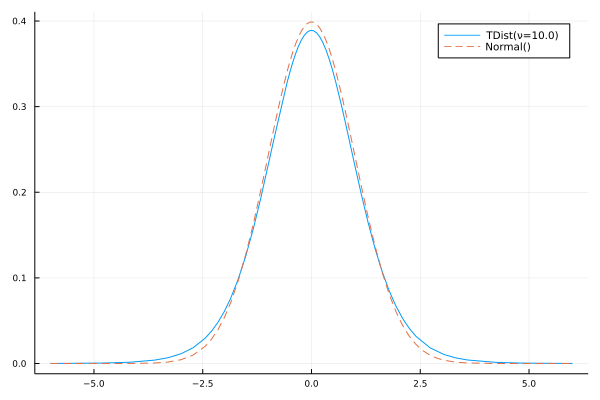

In [20]:
dist = TDist(10); plot(dist, -6, 6; label=name(dist))
plot!(Normal(), -6, 6; label="Normal()", ls=:dash)

1000000 samples with size n = 10 of TDist(ν=10.0)
skewness, kurtosis = 0.0, 1.0
√quantile(T², 0.95) = 2.2372,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0477


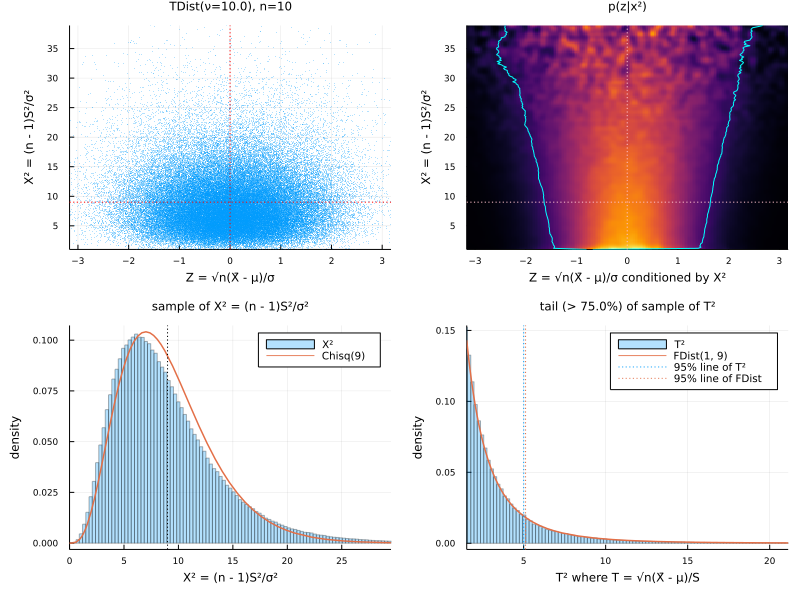

In [21]:
plot_samplestats(dist = TDist(10), n = 10)

1000000 samples with size n = 20 of TDist(ν=10.0)
skewness, kurtosis = 0.0, 1.0
√quantile(T², 0.95) = 2.0843,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0491


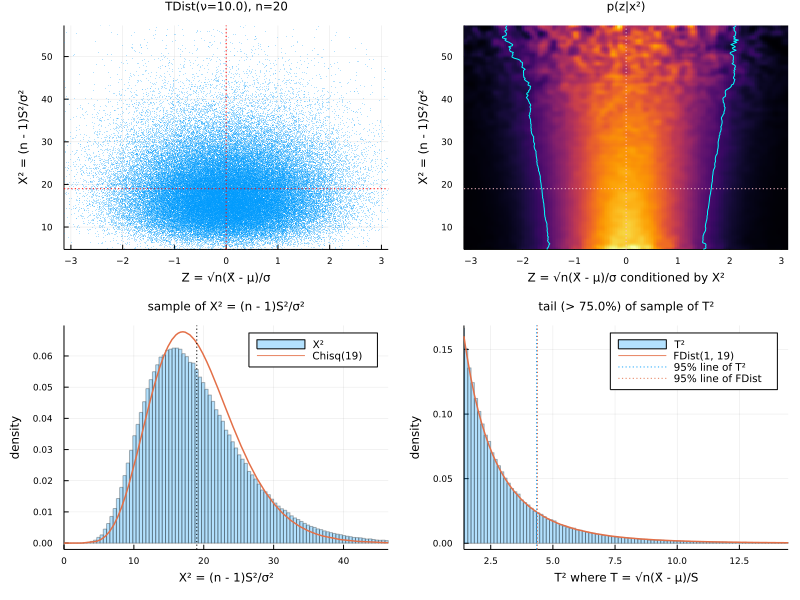

In [22]:
plot_samplestats(dist = TDist(10), n = 20)

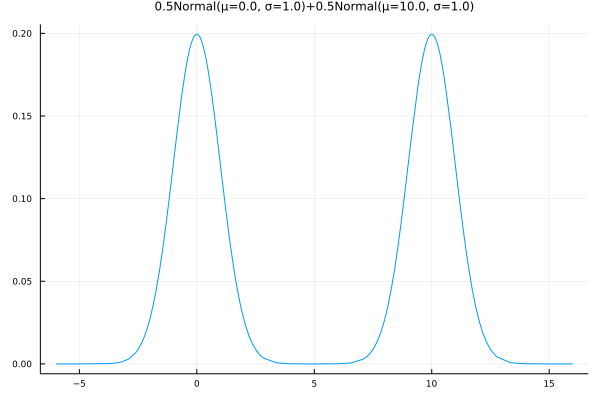

In [23]:
dist = MixtureModel([Normal(), Normal(10, 1)], [0.5, 0.5]); plot(dist, -6, 16; label="", title=name(dist))

1000000 samples with size n = 10 of 0.5Normal(μ=0.0, σ=1.0)+0.5Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 0.0, -1.8491
√quantile(T², 0.95) = 2.326,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0572


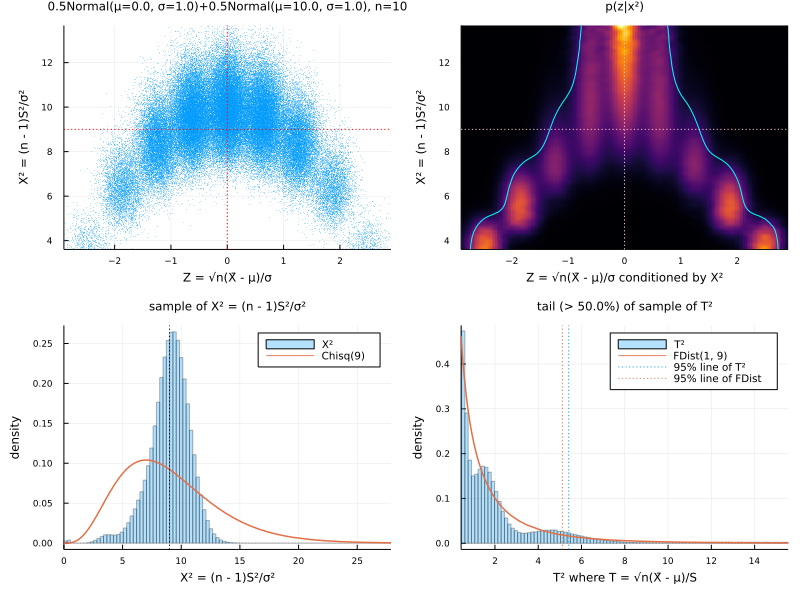

In [24]:
plot_samplestats(; dist, n = 10, X²span = (0.01, 0.999), T²span = (0.50, 0.99))

1000000 samples with size n = 20 of 0.5Normal(μ=0.0, σ=1.0)+0.5Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 0.0, -1.8491
√quantile(T², 0.95) = 2.1065,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0512


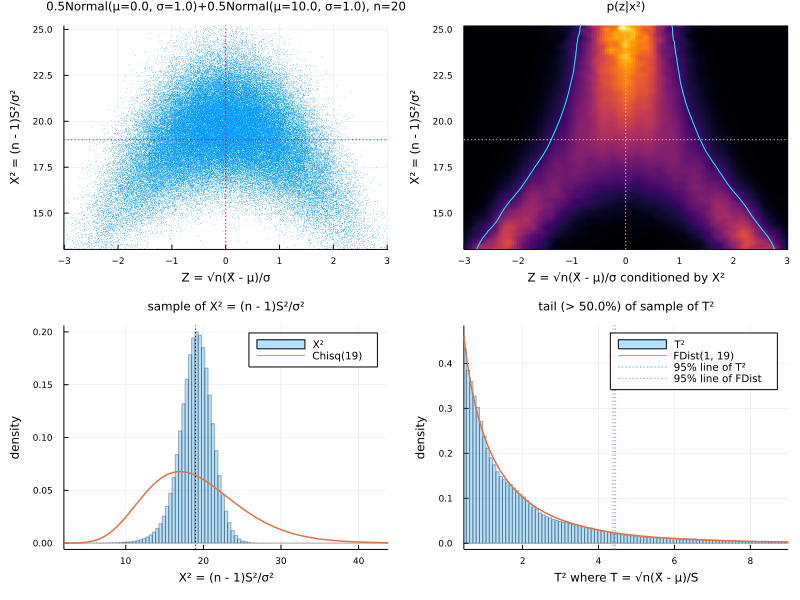

In [25]:
plot_samplestats(; dist, n = 20, X²span = (0.01, 0.999), T²span = (0.50, 0.99))

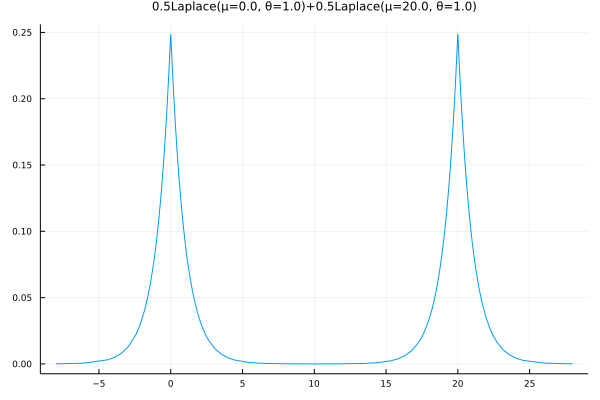

In [26]:
dist = MixtureModel([Laplace(), Laplace(20, 1)], [0.5, 0.5]); plot(dist, -8, 28; label="", title=name(dist))

1000000 samples with size n = 10 of 0.5Laplace(μ=0.0, θ=1.0)+0.5Laplace(μ=20.0, θ=1.0)
skewness, kurtosis = -0.0, -1.9212
√quantile(T², 0.95) = 2.3091,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0584


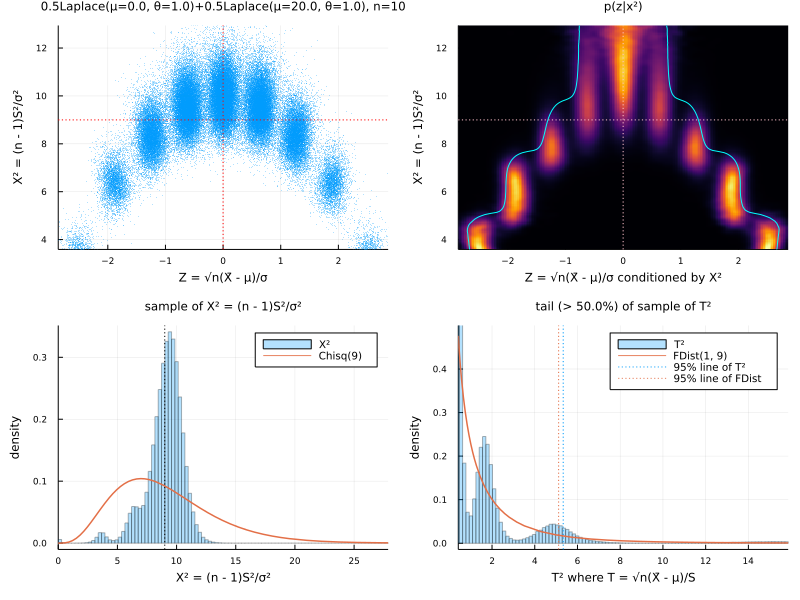

In [27]:
plot_samplestats(; dist, n = 10, X²span = (0.01, 0.999), T²span = (0.50, 0.99))

1000000 samples with size n = 20 of 0.5Laplace(μ=0.0, θ=1.0)+0.5Laplace(μ=20.0, θ=1.0)
skewness, kurtosis = -0.0, -1.9212
√quantile(T², 0.95) = 2.0723,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0481


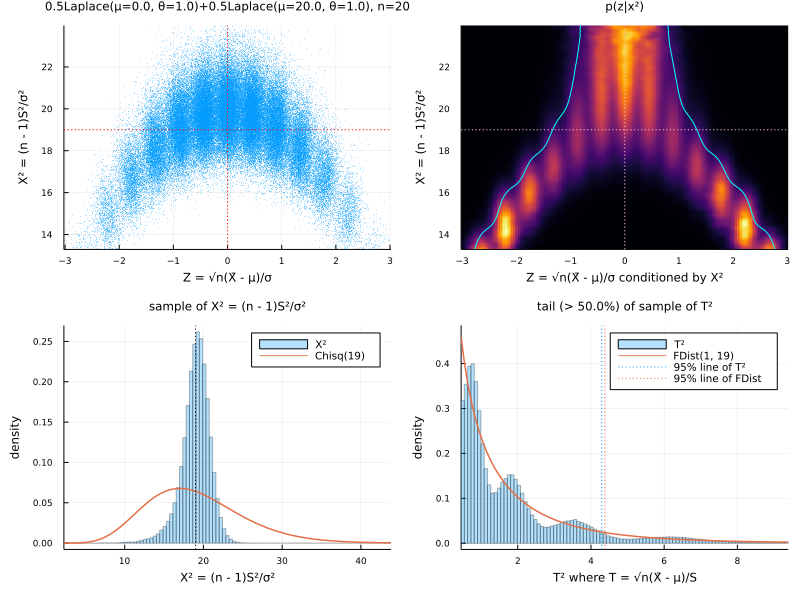

In [28]:
plot_samplestats(; dist, n = 20, X²span = (0.01, 0.999), T²span = (0.50, 0.99))

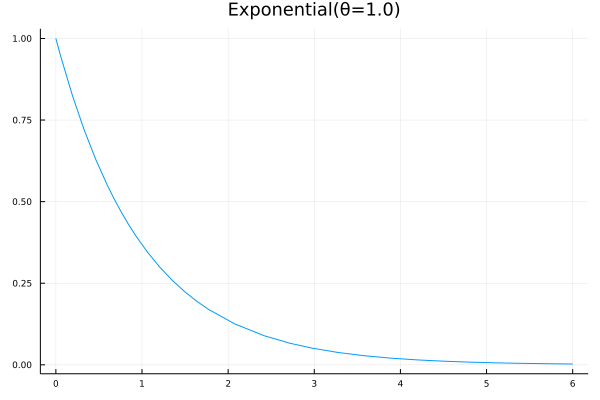

In [29]:
dist = Exponential(); plot(dist, 0, 6; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 3.1329,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0992


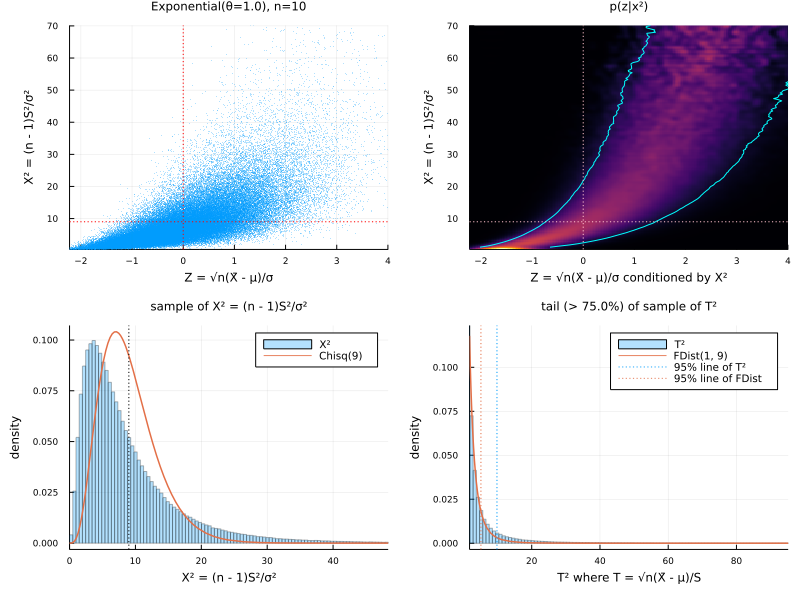

In [30]:
plot_samplestats(dist = Exponential(), n = 10)

1000000 samples with size n = 20 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.5092,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.0812


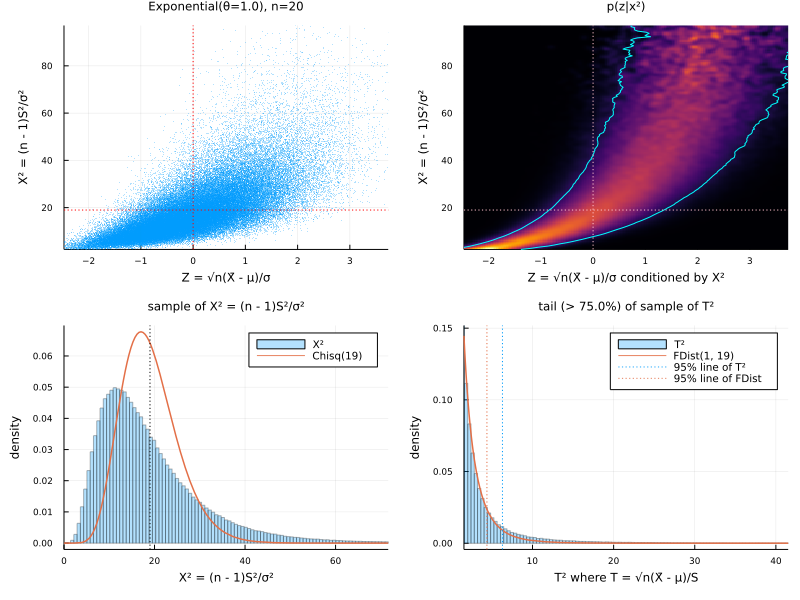

In [31]:
plot_samplestats(dist = Exponential(), n = 20)

1000000 samples with size n = 40 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.2217,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0677


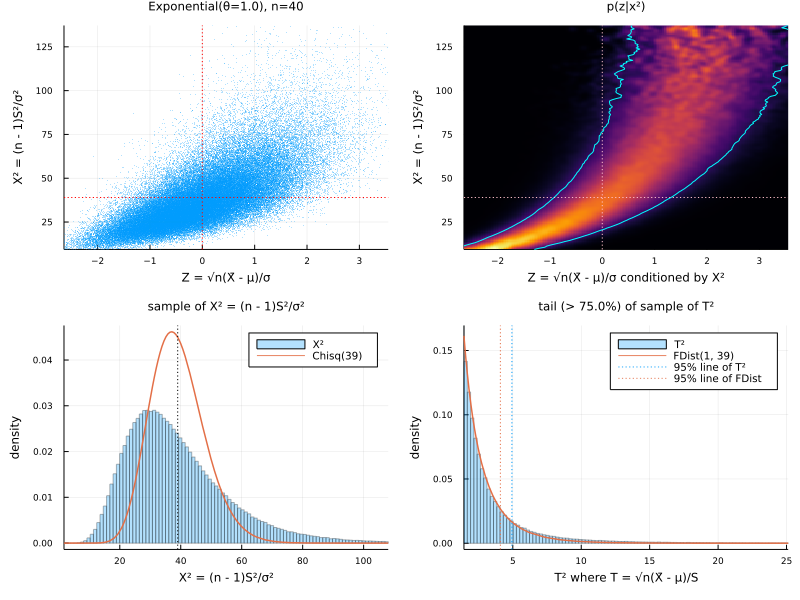

In [32]:
plot_samplestats(dist = Exponential(), n = 40)

1000000 samples with size n = 80 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.0916,  
P(|T| > √quantile(FDist(1, 79), 0.95) = 1.9905) = 0.0601


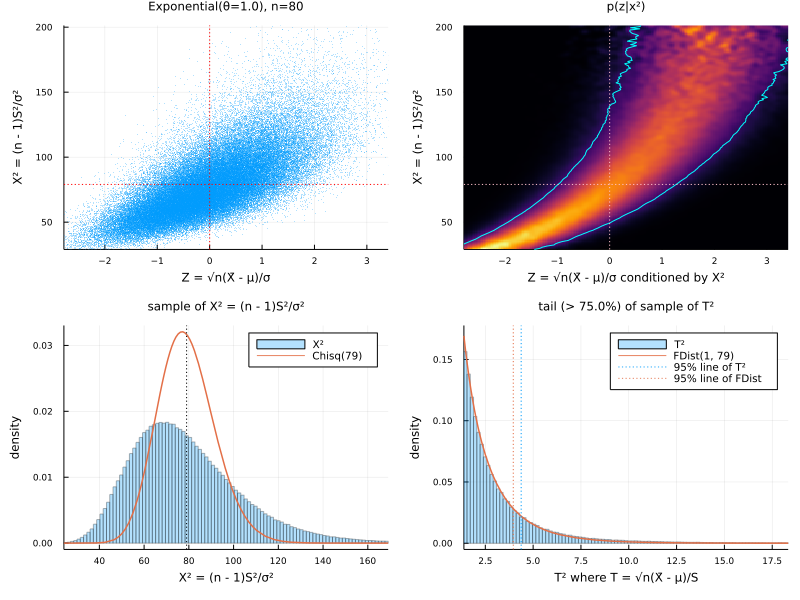

In [33]:
plot_samplestats(dist = Exponential(), n = 80)

1000000 samples with size n = 160 of Exponential(θ=1.0)
skewness, kurtosis = 2.0, 6.0
√quantile(T², 0.95) = 2.0243,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0553


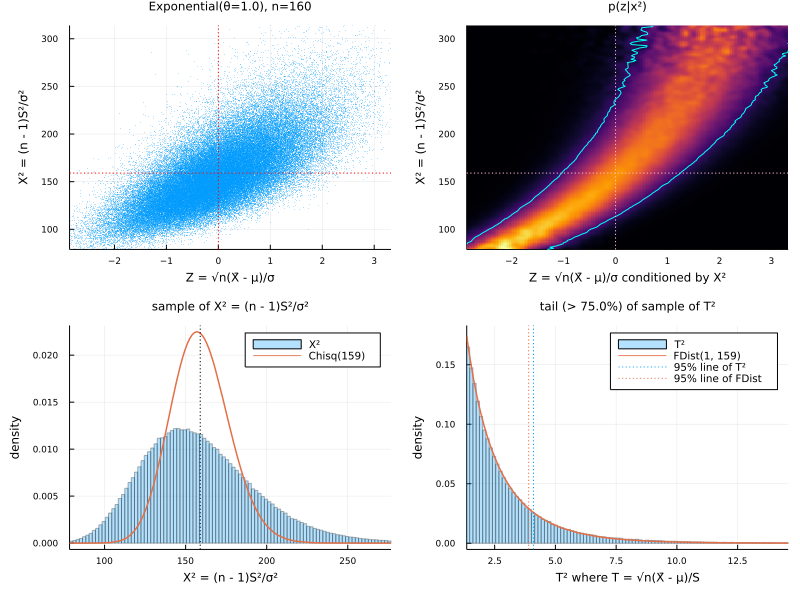

In [34]:
plot_samplestats(dist = Exponential(), n = 160)

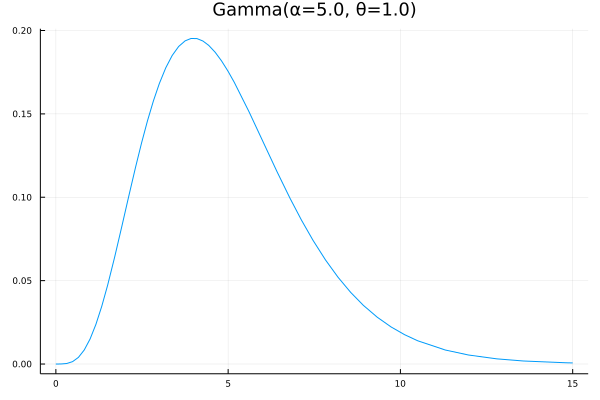

In [35]:
dist = Gamma(5, 1); plot(dist, 0, 15; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.4076,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.0609


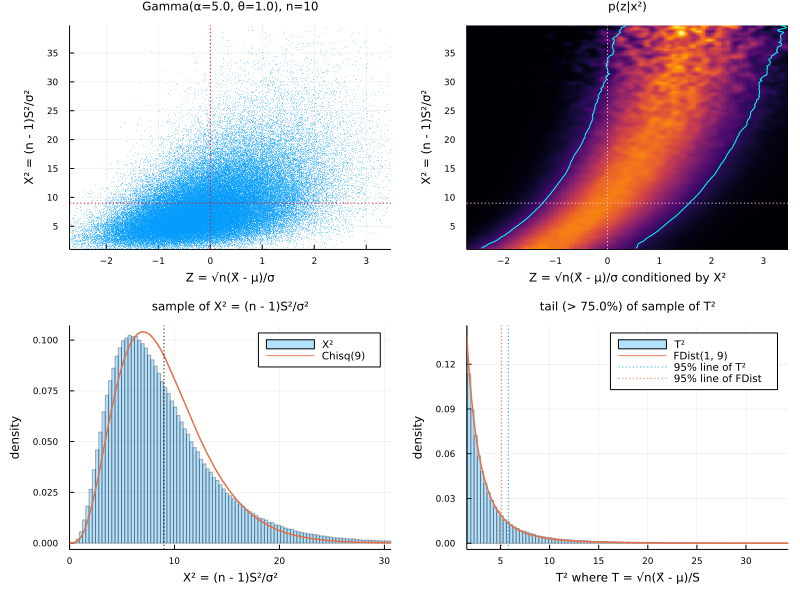

In [36]:
plot_samplestats(dist = Gamma(5, 1), n = 10)

1000000 samples with size n = 20 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.1698,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.057


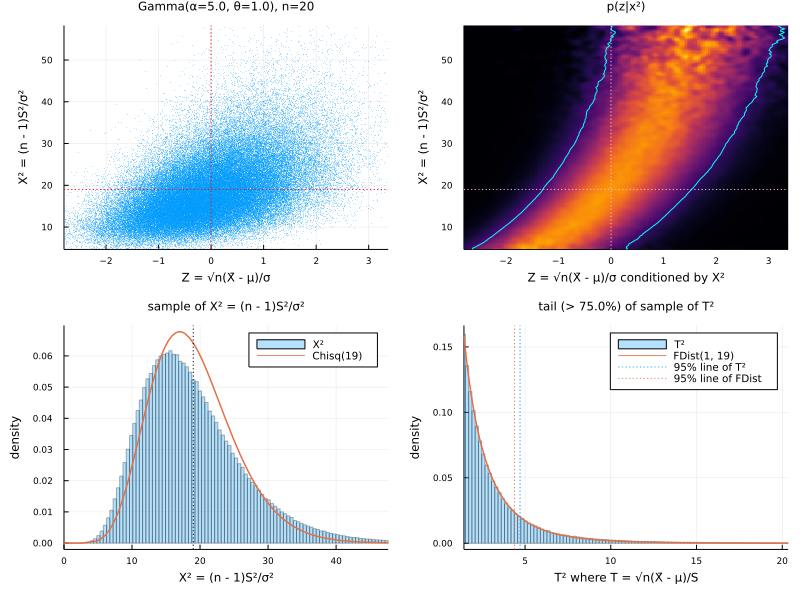

In [37]:
plot_samplestats(dist = Gamma(5, 1), n = 20)

1000000 samples with size n = 40 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.0571,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.0536


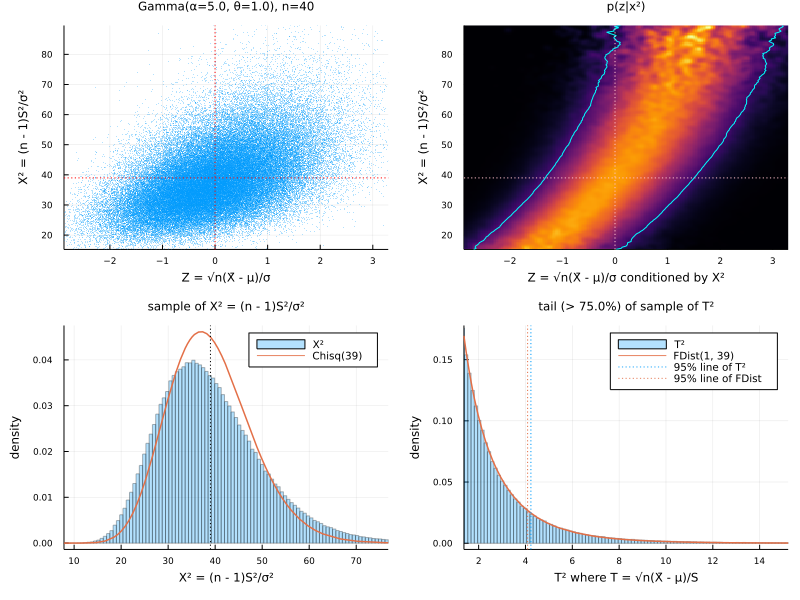

In [38]:
plot_samplestats(dist = Gamma(5, 1), n = 40)

1000000 samples with size n = 80 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 2.0077,  
P(|T| > √quantile(FDist(1, 79), 0.95) = 1.9905) = 0.0519


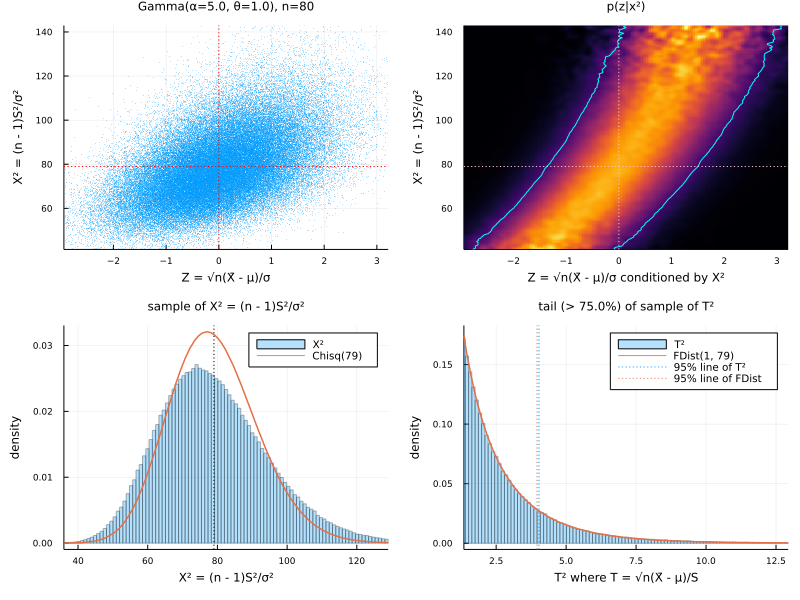

In [39]:
plot_samplestats(dist = Gamma(5, 1), n = 80)

1000000 samples with size n = 160 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9847,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0511


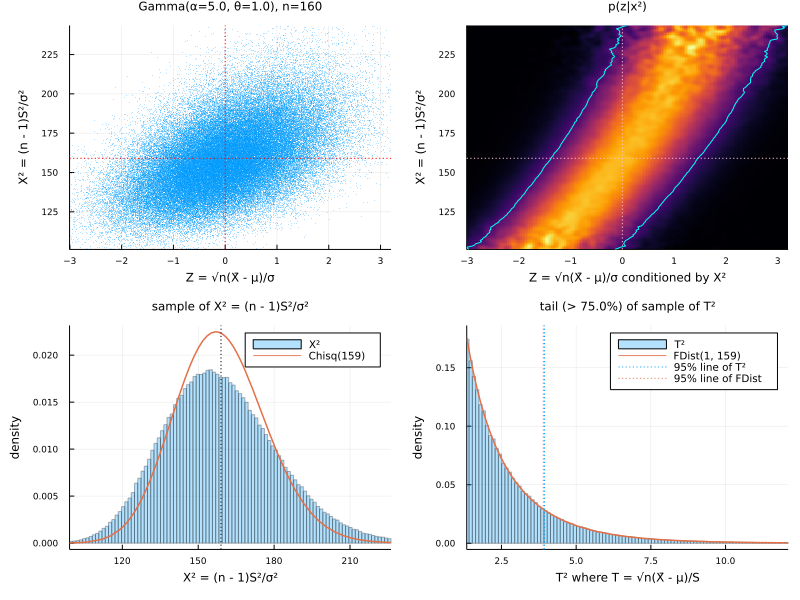

In [40]:
plot_samplestats(dist = Gamma(5, 1), n = 160)

1000000 samples with size n = 320 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9717,  
P(|T| > √quantile(FDist(1, 319), 0.95) = 1.9674) = 0.0505


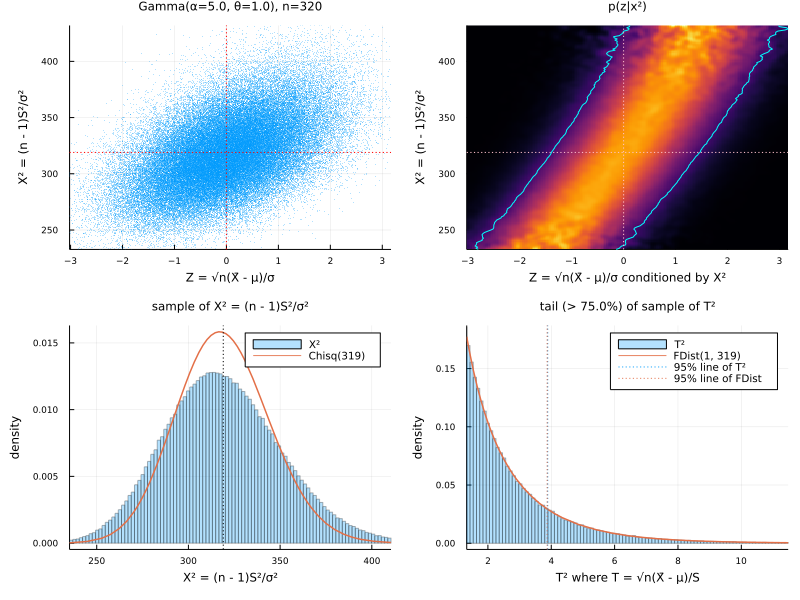

In [41]:
plot_samplestats(dist = Gamma(5, 1), n = 320)

1000000 samples with size n = 640 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9654,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0502


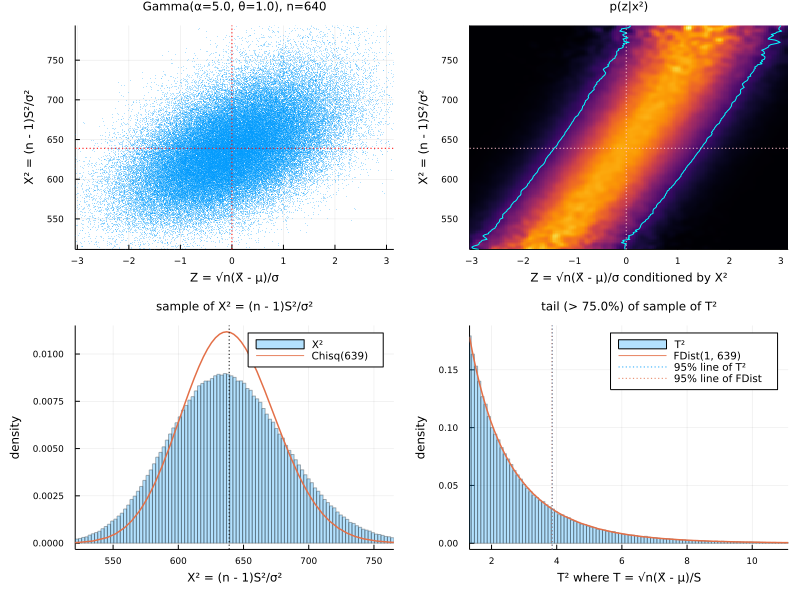

In [42]:
plot_samplestats(dist = Gamma(5, 1), n = 640)

1000000 samples with size n = 1280 of Gamma(α=5.0, θ=1.0)
skewness, kurtosis = 0.8944, 1.2
√quantile(T², 0.95) = 1.9641,  
P(|T| > √quantile(FDist(1, 1279), 0.95) = 1.9618) = 0.0503


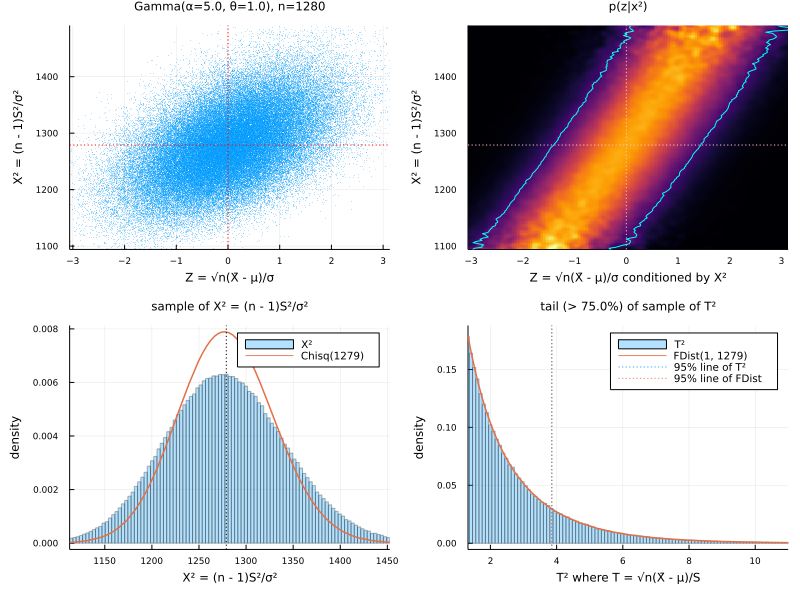

In [43]:
plot_samplestats(dist = Gamma(5, 1), n = 1280)

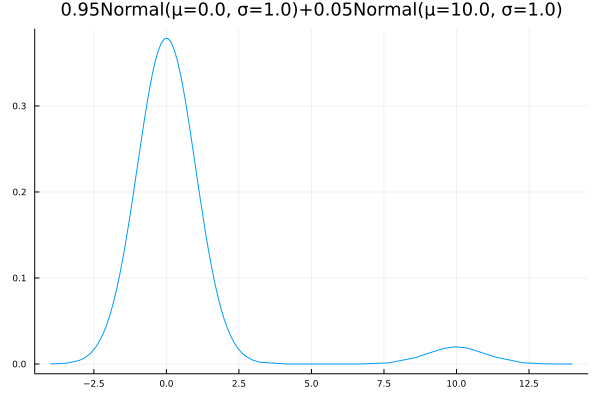

In [44]:
dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05])
plot(dist, -4, 14; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 3.4284,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.1758


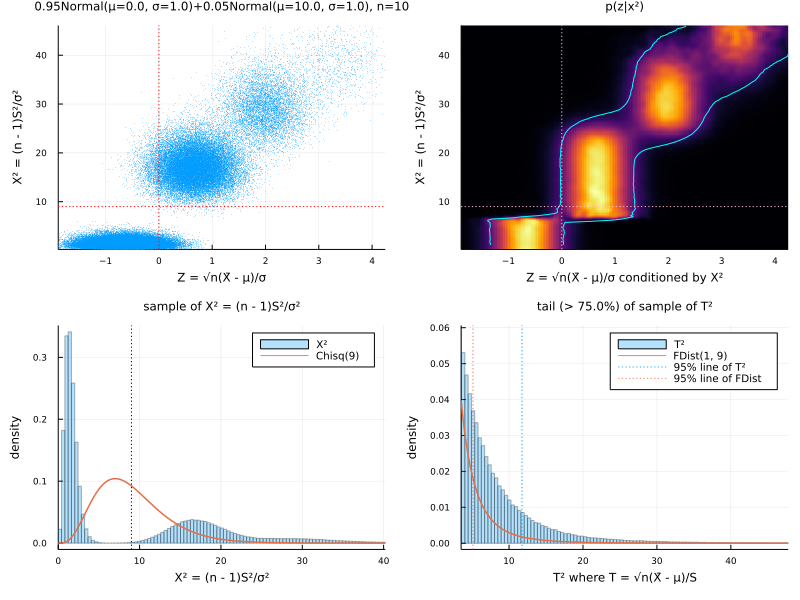

In [45]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 10)

1000000 samples with size n = 20 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 3.53,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.2045


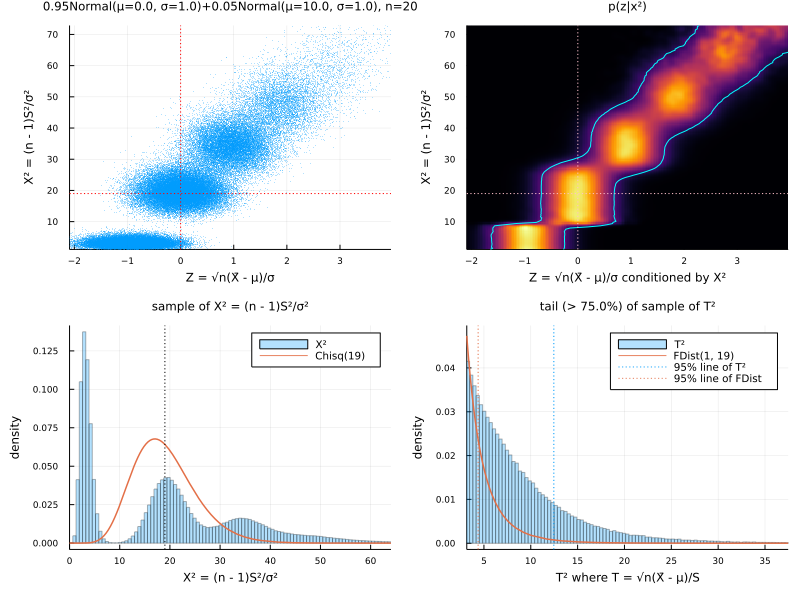

In [46]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 20)

1000000 samples with size n = 40 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 3.4839,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.1199


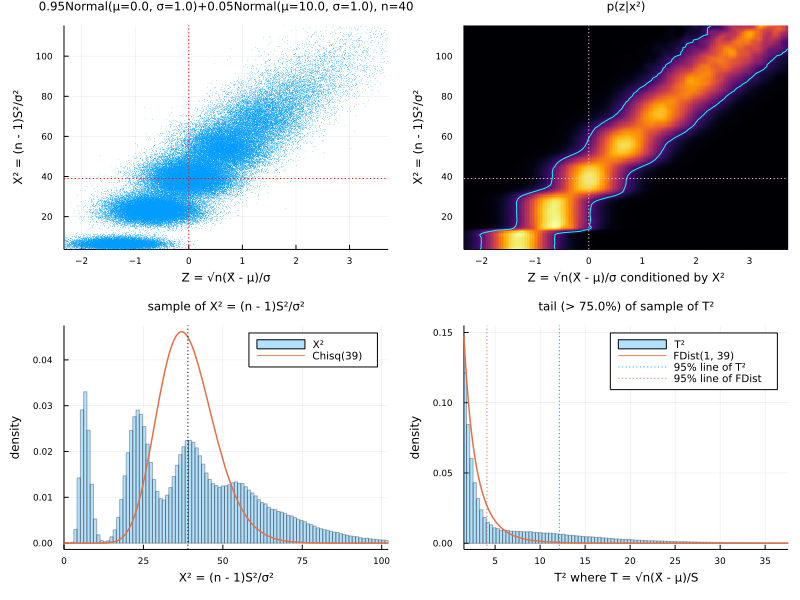

In [47]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 40)

1000000 samples with size n = 80 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 2.3519,  
P(|T| > √quantile(FDist(1, 79), 0.95) = 1.9905) = 0.0783


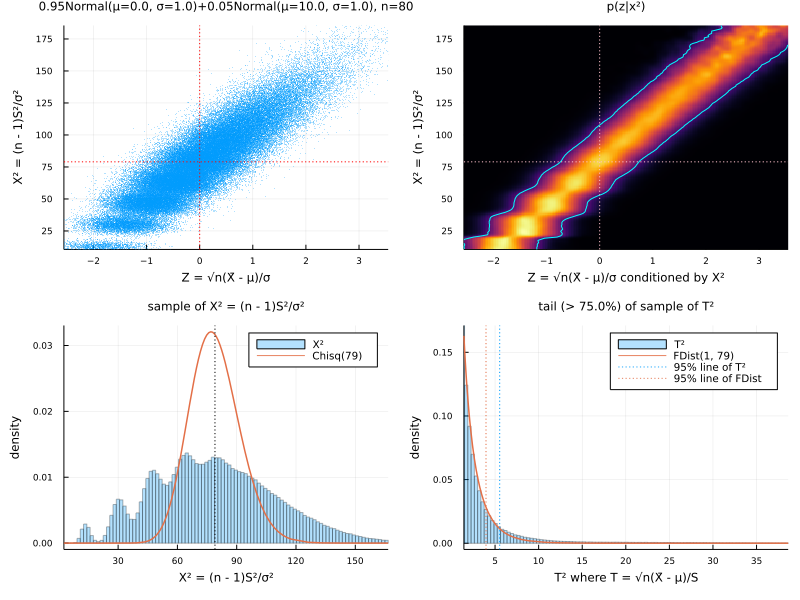

In [48]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 80)

1000000 samples with size n = 160 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 2.1249,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.0646


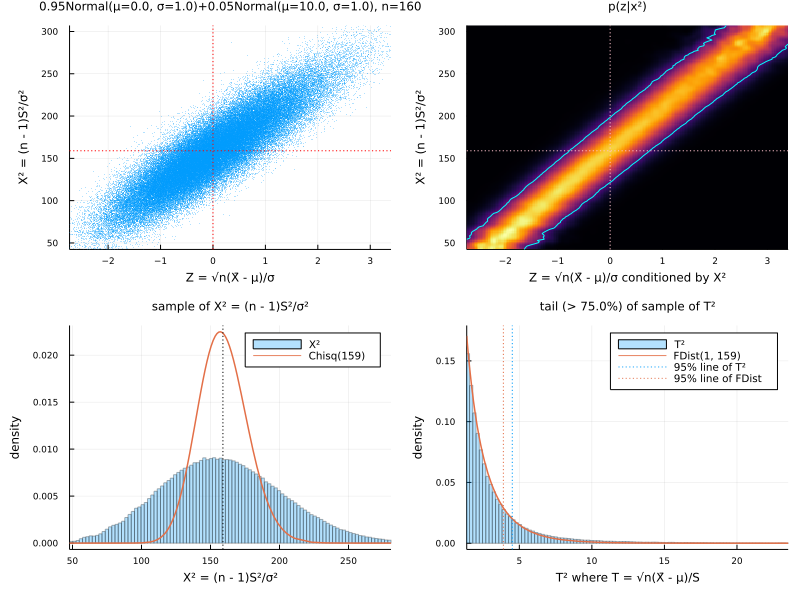

In [49]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 160)

1000000 samples with size n = 320 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 2.0291,  
P(|T| > √quantile(FDist(1, 319), 0.95) = 1.9674) = 0.0567


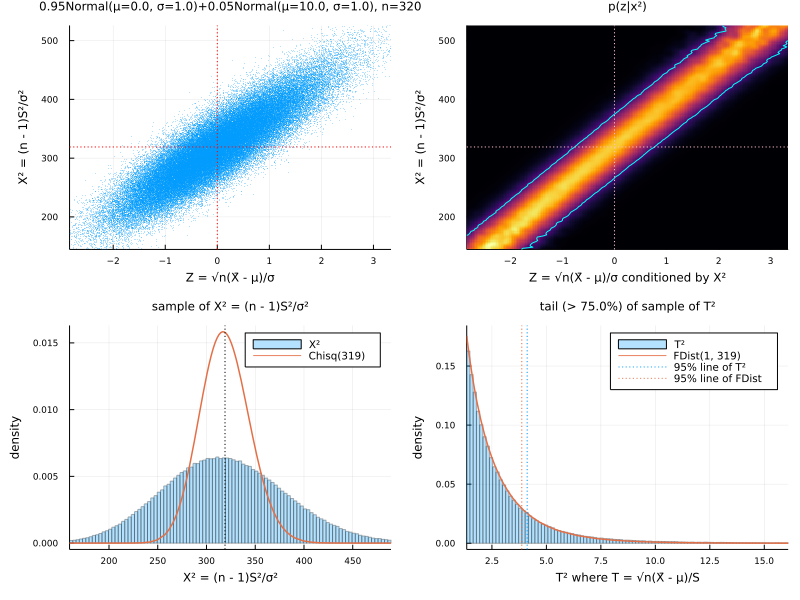

In [50]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 320)

1000000 samples with size n = 640 of 0.95Normal(μ=0.0, σ=1.0)+0.05Normal(μ=10.0, σ=1.0)
skewness, kurtosis = 3.1005, 10.2722
√quantile(T², 0.95) = 1.9943,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0534


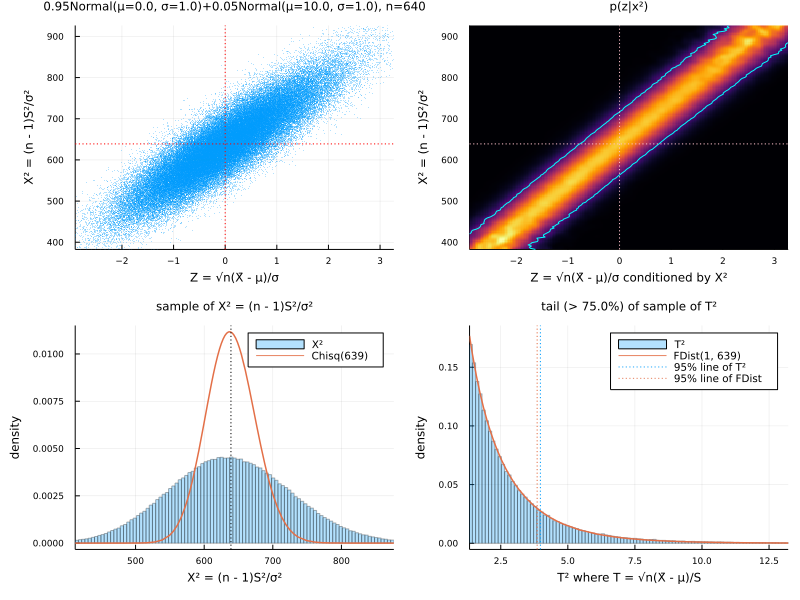

In [51]:
plot_samplestats(dist = MixtureModel([Normal(), Normal(10,1)], [0.95, 0.05]), n = 640)

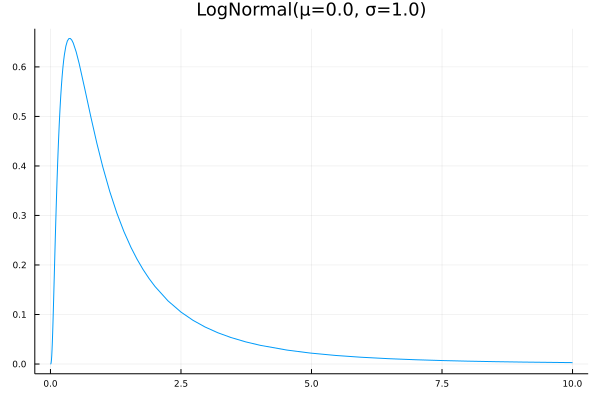

In [52]:
dist = LogNormal()
plot(dist, 0, 10; label="", title=name(dist), titlefontsize=12)

1000000 samples with size n = 10 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 4.3338,  
P(|T| > √quantile(FDist(1, 9), 0.95) = 2.2622) = 0.1602


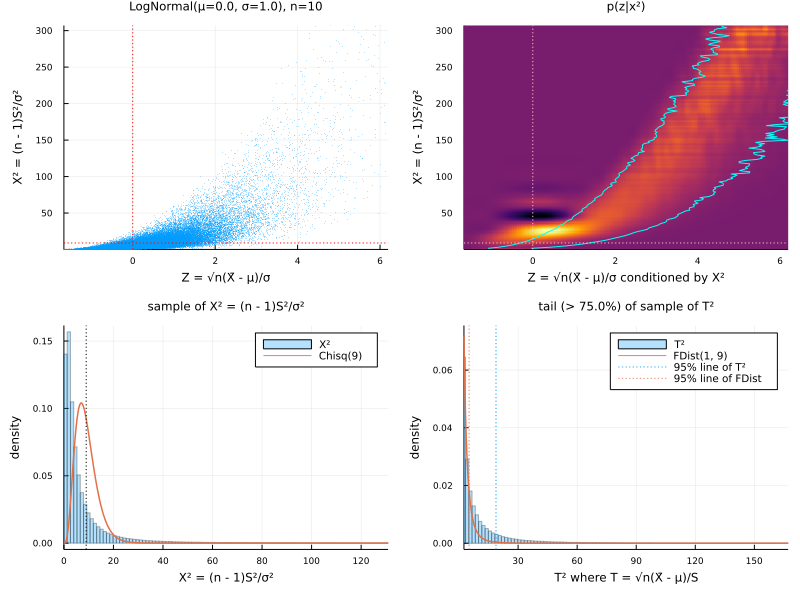

In [53]:
plot_samplestats(dist = LogNormal(), n = 10)

1000000 samples with size n = 20 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 3.3755,  
P(|T| > √quantile(FDist(1, 19), 0.95) = 2.093) = 0.1338


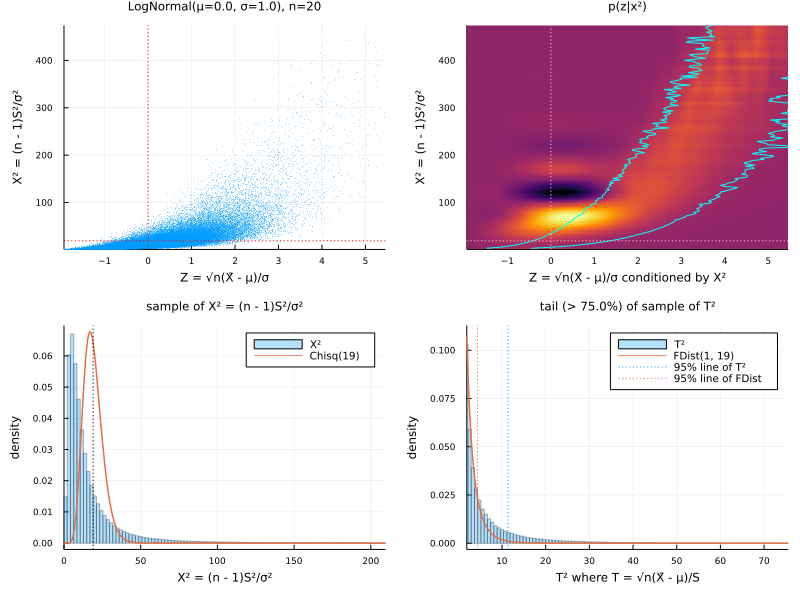

In [54]:
plot_samplestats(dist = LogNormal(), n = 20)

1000000 samples with size n = 40 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.8012,  
P(|T| > √quantile(FDist(1, 39), 0.95) = 2.0227) = 0.1075


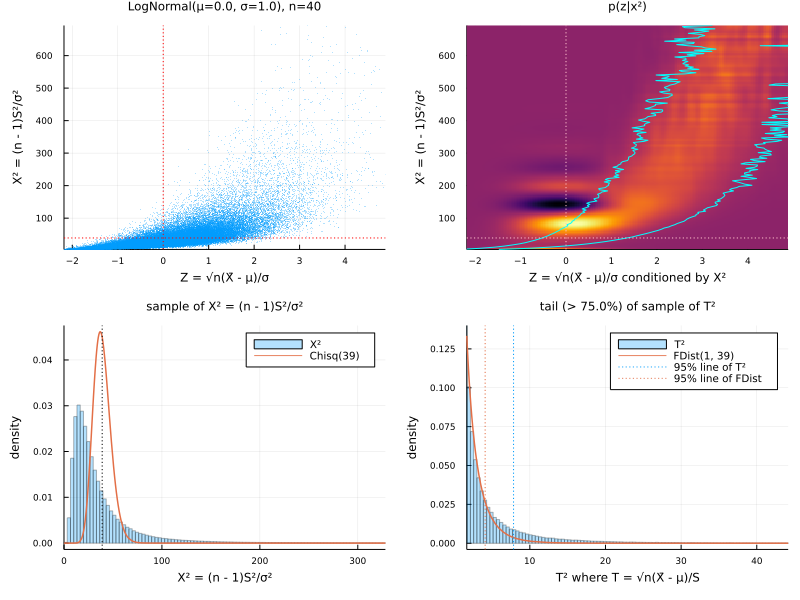

In [55]:
plot_samplestats(dist = LogNormal(), n = 40)

1000000 samples with size n = 80 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.4491,  
P(|T| > √quantile(FDist(1, 79), 0.95) = 1.9905) = 0.088


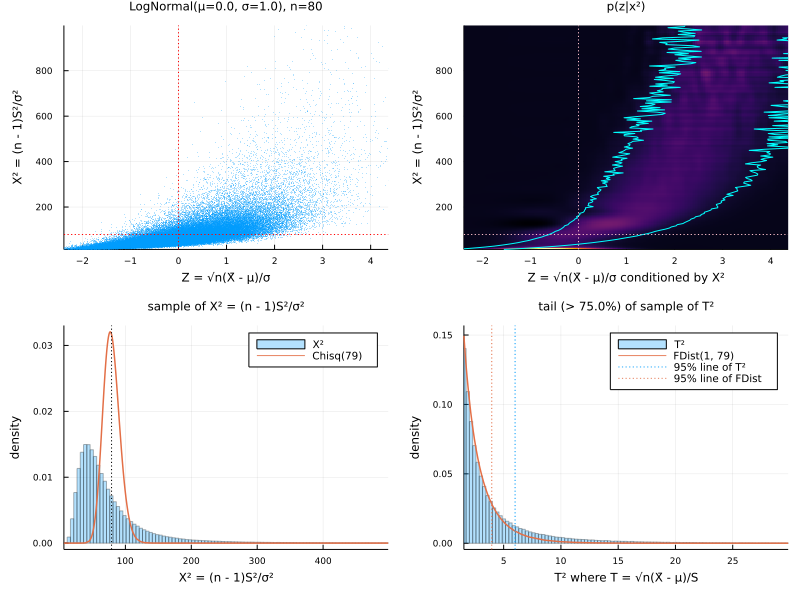

In [56]:
plot_samplestats(dist = LogNormal(), n = 80)

1000000 samples with size n = 160 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.2315,  
P(|T| > √quantile(FDist(1, 159), 0.95) = 1.975) = 0.074


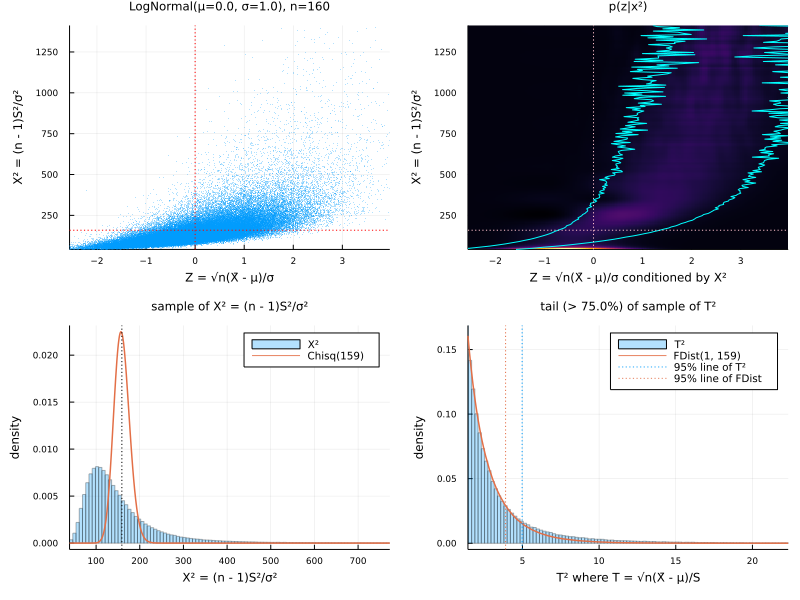

In [57]:
plot_samplestats(dist = LogNormal(), n = 160)

1000000 samples with size n = 320 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.1046,  
P(|T| > √quantile(FDist(1, 319), 0.95) = 1.9674) = 0.0639


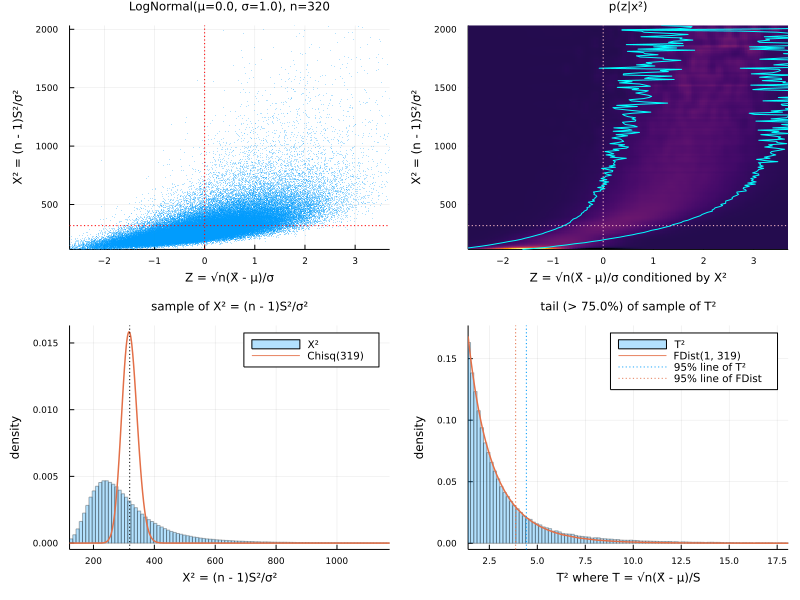

In [58]:
plot_samplestats(dist = LogNormal(), n = 320)

1000000 samples with size n = 640 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.0408,  
P(|T| > √quantile(FDist(1, 639), 0.95) = 1.9637) = 0.0583


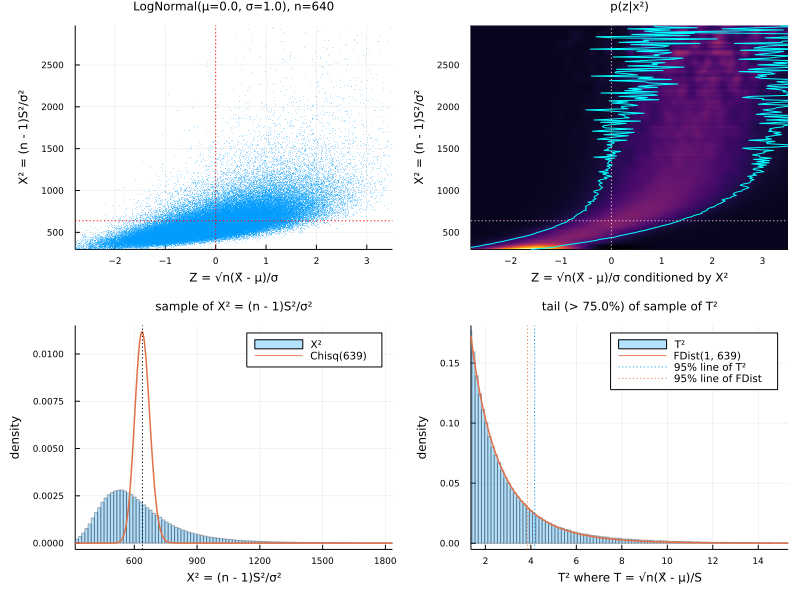

In [59]:
plot_samplestats(dist = LogNormal(), n = 640)

1000000 samples with size n = 1280 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 2.0038,  
P(|T| > √quantile(FDist(1, 1279), 0.95) = 1.9618) = 0.0548


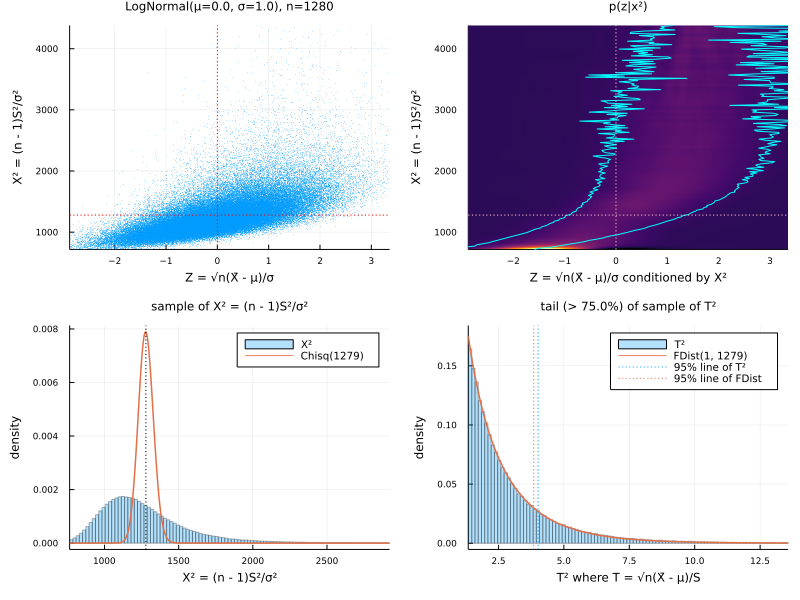

In [60]:
plot_samplestats(dist = LogNormal(), n = 1280)

1000000 samples with size n = 2560 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9832,  
P(|T| > √quantile(FDist(1, 2559), 0.95) = 1.9609) = 0.0525


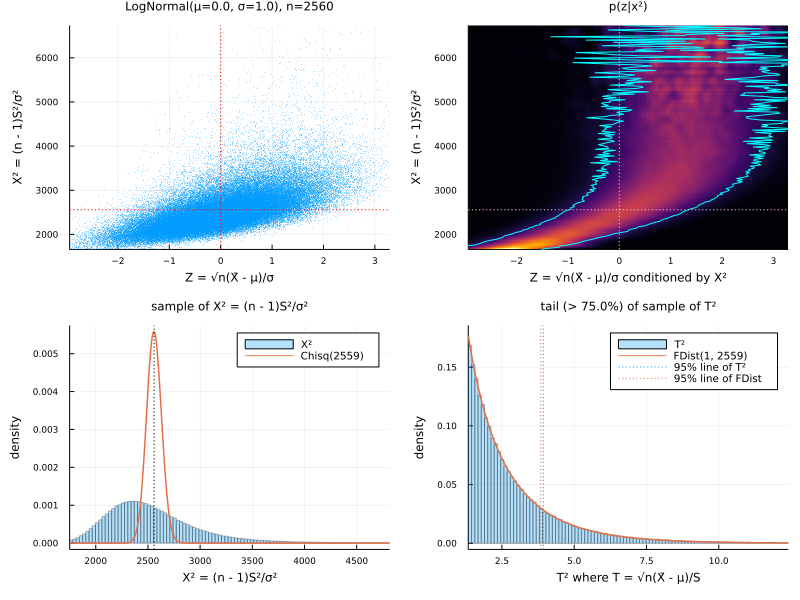

In [61]:
plot_samplestats(dist = LogNormal(), n = 2560)

1000000 samples with size n = 5120 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9743,  
P(|T| > √quantile(FDist(1, 5119), 0.95) = 1.9604) = 0.0516


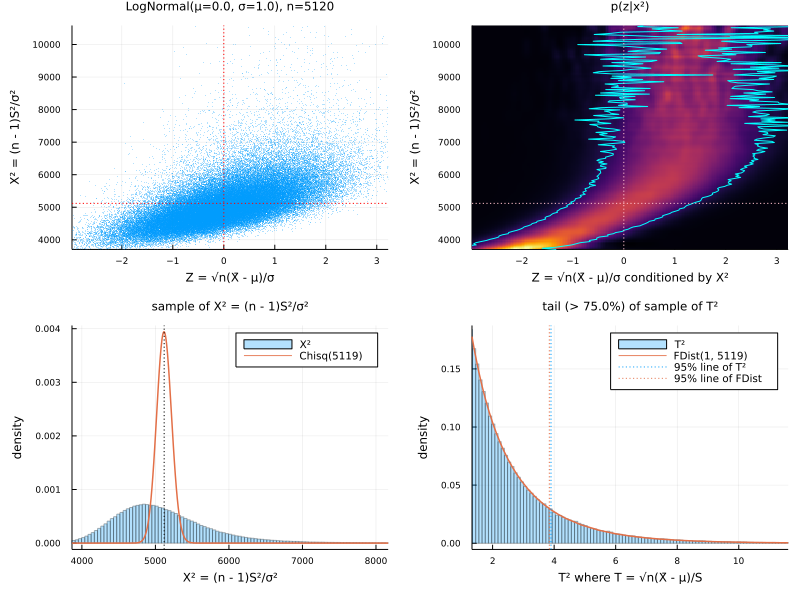

In [62]:
plot_samplestats(dist = LogNormal(), n = 5120)

1000000 samples with size n = 10240 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9658,  
P(|T| > √quantile(FDist(1, 10239), 0.95) = 1.9602) = 0.0506
 24.897396 seconds (67.68 k allocations: 235.566 MiB, 0.12% gc time)


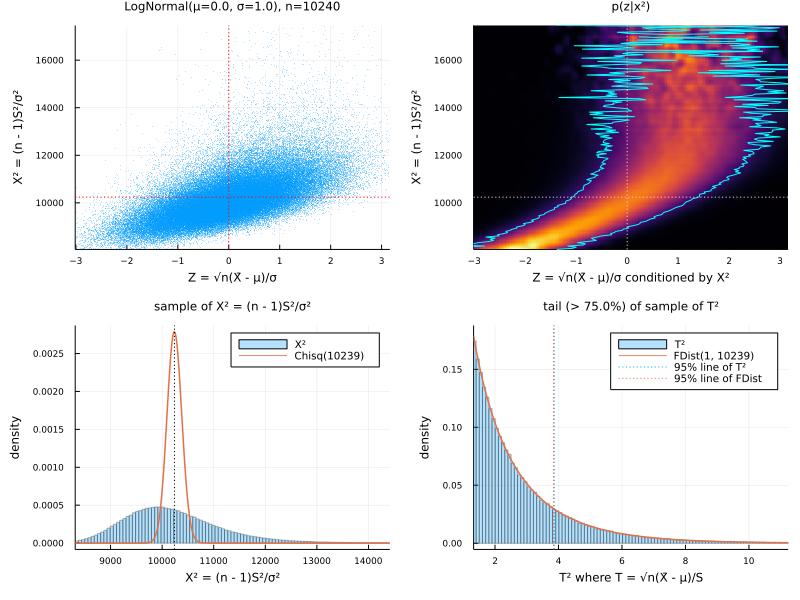

In [63]:
@time plot_samplestats(dist = LogNormal(), n = 10240)

1000000 samples with size n = 20480 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9624,  
P(|T| > √quantile(FDist(1, 20479), 0.95) = 1.9601) = 0.0503
 47.503834 seconds (67.62 k allocations: 235.560 MiB, 0.03% gc time)


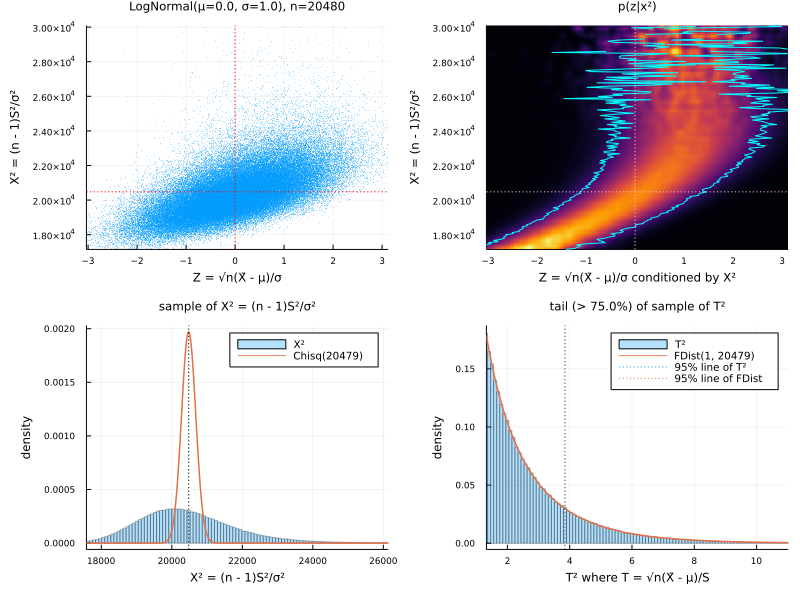

In [64]:
@time plot_samplestats(dist = LogNormal(), n = 20480)

1000000 samples with size n = 40960 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9605,  
P(|T| > √quantile(FDist(1, 40959), 0.95) = 1.96) = 0.05
 92.523381 seconds (67.48 k allocations: 236.787 MiB, 0.02% gc time)


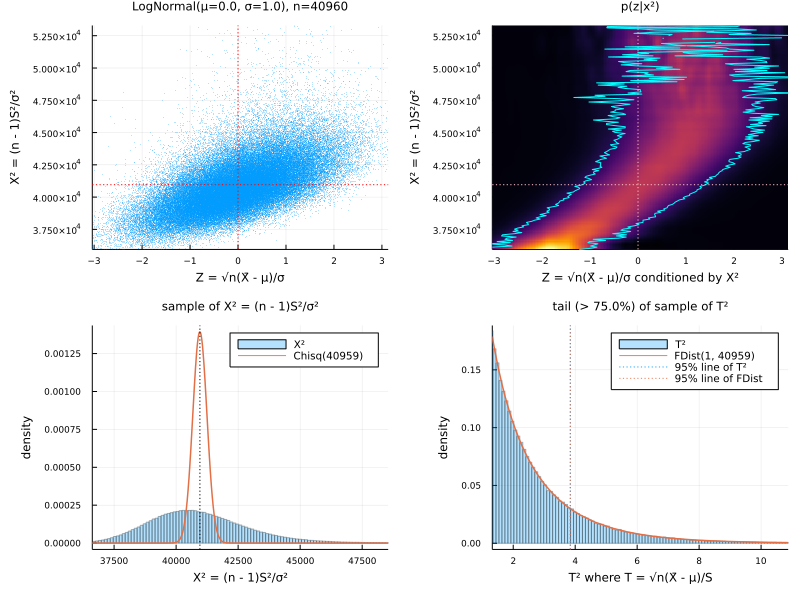

In [65]:
@time plot_samplestats(dist = LogNormal(), n = 40960)

1000000 samples with size n = 81920 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9619,  
P(|T| > √quantile(FDist(1, 81919), 0.95) = 1.96) = 0.0502
190.661853 seconds (67.72 k allocations: 239.921 MiB, 0.02% gc time)


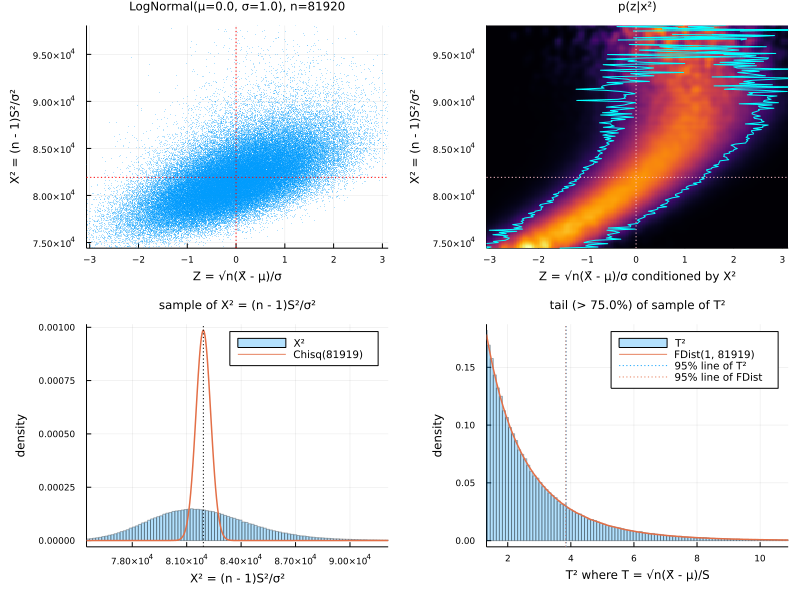

In [66]:
@time plot_samplestats(dist = LogNormal(), n = 81920)

1000000 samples with size n = 163840 of LogNormal(μ=0.0, σ=1.0)
skewness, kurtosis = 6.1849, 110.9364
√quantile(T², 0.95) = 1.9606,  
P(|T| > √quantile(FDist(1, 163839), 0.95) = 1.96) = 0.0501
415.332764 seconds (67.72 k allocations: 246.989 MiB, 0.00% gc time)


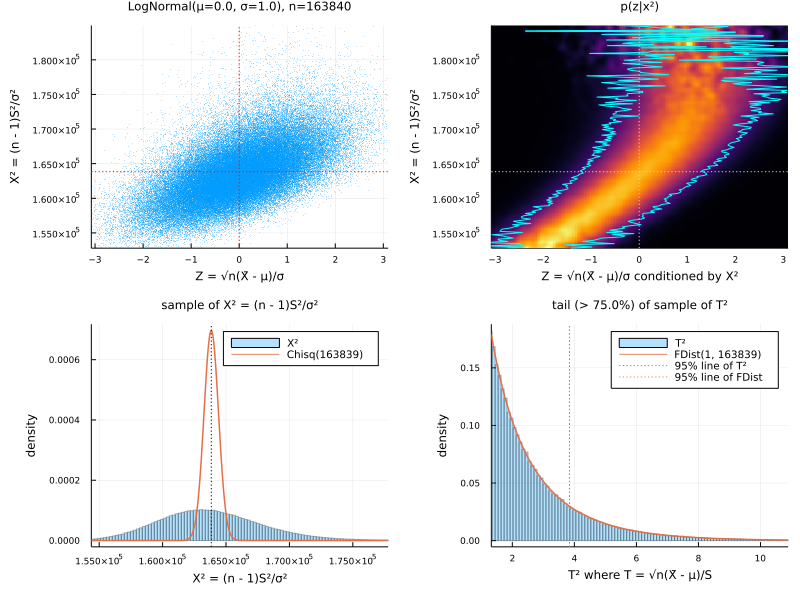

In [67]:
@time plot_samplestats(dist = LogNormal(), n = 163840)